In [2]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import plotly.express as px
import seaborn as sns
from datetime import datetime

# TESTS
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.vector_ar.vecm import coint_johansen

# DEPENDENCIES FOR LINEAR REGRESSION MODEL
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler

# DEPENDENCIES FOR VECTOR AUTO REGGRESIVE
from statsmodels.tsa.api import VAR

# Functions

### Data-preprocessing function

In [3]:
def clean_and_interpolate_hourly(df, verbose=True):
    """
    Cleans a time-indexed DataFrame by:
    - Dropping NaNs
    - Removing duplicate timestamps via averaging
    - Reindexing to ensure full hourly range
    - Interpolating missing values

    Parameters:
    - df (pd.DataFrame): Time-indexed DataFrame
    - verbose (bool): Whether to print status updates

    Returns:
    - pd.DataFrame: Cleaned and interpolated DataFrame
    """
    df_clean = df.dropna()
    if verbose:
        print(df_clean.columns, df_clean.shape)

        duplicates_before = df_clean.index.duplicated().sum()
        print(f"Number of duplicate timestamps BEFORE: {duplicates_before}")

    # Resolve duplicates by averaging
    df_clean = df_clean.groupby(df_clean.index).mean()

    if verbose:
        duplicates_after = df_clean.index.duplicated().sum()
        print(f"Number of duplicate timestamps AFTER: {duplicates_after}\n")

    # Create expected hourly index
    expected_index = pd.date_range(start=df_clean.index.min(), end=df_clean.index.max(), freq='h')
    missing = expected_index.difference(df_clean.index)
    if verbose:
        print(f"Number of missing hourly timestamps BEFORE: {len(missing)}")
        if len(missing) > 0:
            print(missing[:10])  # Show first 10

    # Reindex and interpolate
    df_clean = df_clean.reindex(expected_index)
    df_clean = df_clean.interpolate(method='time')

    missing_after = expected_index.difference(df_clean.index)
    if verbose:
        print(f"Number of missing hourly timestamps AFTER: {len(missing_after)}")
        if len(missing_after) > 0:
            print(missing_after[:10])

    return df_clean


## Data slicing functions

### Bi-weekly

In [4]:
def split_biweekly_train_test(df: pd.DataFrame) -> dict:
    biweekly_data = {'period': [], 'train': [], 'test': []}

    start = df.index.min()
    end   = df.index.max()
    current = start

    while current + pd.Timedelta(days=14) <= end:
        train_start = current
        train_end   = current + pd.Timedelta(days=14) - pd.Timedelta(hours=1)

        test_start = train_end + pd.Timedelta(hours=1)
        test_end   = test_start + pd.Timedelta(hours=23)

        # slice train; guaranteed to be within bounds
        train_df = df.loc[train_start:train_end]

        # slice test; guard against going past the dataset end
        if test_end <= end:
            test_df = df.loc[test_start:test_end]
        else:
            print(f"WARNING: Incomplete test window for period starting {train_start.date()}")
            test_df = pd.DataFrame(columns=df.columns)

        period_label = f"{train_start.date()}_to_{train_end.date()}"

        biweekly_data['period'].append(period_label)
        biweekly_data['train'].append(train_df)
        biweekly_data['test'].append(test_df)

        # advance window by exactly 14 days
        current += pd.Timedelta(days=14)

    # print summary
    total = len(biweekly_data['period'])
    print("Total periods:", total)
    for i, period in enumerate(biweekly_data['period']):
        n_train = len(biweekly_data['train'][i])
        n_test  = len(biweekly_data['test'][i])
        print(f"{period}: Train = {n_train}, Test = {n_test}")

    return biweekly_data


### Monthly

In [5]:
def split_monthly_train_test(df: pd.DataFrame) -> dict:
    """
    Splits an hourly-indexed DataFrame into monthly train/test sets.
    
    - For December: train = first 30 days, test = last day (24h)
    - For other months: train = full month, test = next 24h (if available)
    
    Prints:
      - Total number of periods processed
      - For each period, the lengths of train and test sets.
    
    Returns:
      {
        'period': [ '2024-01', '2024-02', … ],
        'train':  [ train_df_for_2024-01, … ],
        'test':   [ test_df_for_2024-01, … ]
      }
    """
    monthly_data = {'period': [], 'train': [], 'test': []}

    # Group by month period
    for period, group in df.groupby(df.index.to_period('M')):
        month_df = group.sort_index()
        start = month_df.index[0]
        end   = month_df.index[-1]

        if start.month == 12:
            # December: first 30 days → train; last day → test
            train_end  = start + pd.Timedelta(days=30)
            train_df   = month_df.loc[start : train_end - pd.Timedelta(hours=1)]
            test_start = train_end
            test_end   = test_start + pd.Timedelta(hours=23)
            test_df    = month_df.loc[test_start : test_end]
        else:
            # Other months: train = full month; test = next 24h in the overall df
            train_df = month_df
            try:
                # find the very next timestamp after this month's last hour
                idx       = df.index.get_loc(end) + 1
                test_df   = df.iloc[idx : idx + 24]
            except (IndexError, KeyError):
                # not enough data to form a 24h test set
                print(f"WARNING: Could not build test set for period {period}")
                test_df = pd.DataFrame(columns=df.columns)

        monthly_data['period'].append(str(period))
        monthly_data['train'].append(train_df)
        monthly_data['test'].append(test_df)

    # Print summary
    total = len(monthly_data['period'])
    print("Total periods:", total)
    for i in range(total):
        p = monthly_data['period'][i]
        n_train = len(monthly_data['train'][i])
        n_test  = len(monthly_data['test'][i])
        print(f"{p}: Train = {n_train}, Test = {n_test}")

    return monthly_data


### Quarterly

In [6]:
def split_quarterly_train_test(df: pd.DataFrame) -> dict:
    quarterly_data = {'period': [], 'train': [], 'test': []}

    # Group the DataFrame by quarter
    for period, group in df.groupby(df.index.to_period('Q')):
        q_df = group.sort_index()
        start = q_df.index[0]
        end   = q_df.index[-1]

        if start.month == 10:
            # Q4: last 24h of quarter as test
            train_df = q_df.loc[start : end - pd.Timedelta(hours=24)]
            test_df  = q_df.loc[end - pd.Timedelta(hours=23) : end]
        else:
            # Other quarters: first 24h after quarter end as test
            train_df = q_df
            next_start = end + pd.Timedelta(hours=1)
            test_end   = next_start + pd.Timedelta(hours=23)
            if test_end <= df.index.max():
                test_df = df.loc[next_start : test_end]
            else:
                print(f"WARNING: Incomplete test window for period {period}")
                test_df = pd.DataFrame(columns=df.columns)

        quarterly_data['period'].append(str(period))
        quarterly_data['train'].append(train_df)
        quarterly_data['test'].append(test_df)

    # Print summary
    total = len(quarterly_data['period'])
    print("Total periods:", total)
    for i, period in enumerate(quarterly_data['period']):
        n_train = len(quarterly_data['train'][i])
        n_test  = len(quarterly_data['test'][i])
        print(f"{period}: Train = {n_train}, Test = {n_test}")

    return quarterly_data


In [7]:

def get_prediction_record(period, prediction_records):
    # Loop through the prediction records to find the matching period
    for record in prediction_records:
        if record['period'] == period:
            return record
    return None  # Return None if the period is not found

### Stationarity check function

In [8]:
def adf_test(series,title=''):
    """
    Pass in a time series and an optional title, returns an ADF report
    """
    print(f'Augmented Dickey-Fuller Test: {title}')
    result = adfuller(series.dropna(),autolag='AIC') # .dropna() handles differenced data
    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index=labels)
    for key,val in result[4].items():
        out[f'critical value ({key})']=val
    print(out.to_string())          # .to_string() removes the line "dtype: float64"
    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis")
        print("Reject the null hypothesis")
        print("Data has no unit root and is stationary")
    else:
        print("Weak evidence against the null hypothesis")
        print("Fail to reject the null hypothesis")
        print("Data has a unit root and is non-stationary")

### Plot to find optimal lag for VAR function

In [63]:
def plot_var_criteria(df, maxlags=10):
    model = VAR(df)
    aic_vals, bic_vals, fpe_vals, hqic_vals = [], [], [], []

    lags = list(range(1, maxlags + 1))
    
    for i in lags:
        try:
            result = model.fit(i)
            aic_vals.append(result.aic)
            bic_vals.append(result.bic)
            fpe_vals.append(result.fpe)
            hqic_vals.append(result.hqic)
        except Exception as e:
            # Handle potential errors, e.g., not enough data for high lags
            print(f"Failed to fit VAR for lag {i}: {e}")
            aic_vals.append(None)
            bic_vals.append(None)
            fpe_vals.append(None)
            hqic_vals.append(None)

    # Plotting
    #plt.figure(figsize=(12, 6))
    plt.plot(lags, aic_vals, marker='o', label='AIC')
    plt.plot(lags, bic_vals, marker='o', label='BIC')
    #plt.plot(lags, fpe_vals, marker='o', label='FPE')
    #plt.plot(lags, hqic_vals, marker='o', label='HQIC', alpha = 0.5)

    plt.xlabel('Lag Order')
    plt.ylabel('Criterion Value')
    plt.title('VAR Model Information Criteria')
    plt.legend()
    plt.grid(True)
    plt.show()

### Forecast plot function

In [10]:
def plot_forecast_vs_actual(
    train_df: pd.DataFrame,
    actual_df: pd.DataFrame,
    forecast,  # array-like or pd.Series
    column: str = 'ImbalancePriceEUR',
    period_label: str = '',
    model_order: str = ''
):
    """
    Plots forecasted vs actual values for a given column, including the
    last 48 hours from the training data.

    Parameters
    ----------
    train_df : pd.DataFrame
        Training data (must contain `column`).
    actual_df : pd.DataFrame
        Test data (must contain `column`) with a DatetimeIndex.
    forecast : array-like or pd.Series
        Forecast values corresponding one-to-one with `actual_df.index`.
    column : str
        Name of the target column to plot.
    period_label : str
        Text to include in the title (e.g. the period string).
    model_order : str
        Model identifier for the title.
    """
    # 1) Extract actual and training series
    actual_series = actual_df[column]
    train_series  = train_df[column].iloc[-48:]  # last 48 hours
    
    # 2) Build forecast_series with the same index as actual_df
    if isinstance(forecast, pd.Series):
        # preserve name and index
        forecast_series = forecast.copy()
    else:
        # assume array-like: align to actual_df.index
        forecast_series = pd.Series(
            data=forecast,
            index=actual_df.index,
            name=column
        )

    # 3) Align them in case of any mismatch
    common_idx = train_series.index.union(actual_series.index).union(forecast_series.index)
    # but we only need where forecast & actual overlap
    common_idx = forecast_series.index.intersection(actual_series.index)
    actual_series   = actual_series.loc[common_idx]
    forecast_series = forecast_series.loc[common_idx]

    # 4) Plot
    plt.figure(figsize=(12, 5))
    plt.plot(
        train_series.index, train_series.values,
        label='Training (last 48h)',
        linestyle='-.',
        alpha=0.8
    )
    plt.plot(
        actual_series.index, actual_series.values,
        label='Actual', marker='o', linestyle='-'
    )
    plt.plot(
        forecast_series.index, forecast_series.values,
        label='Forecast', marker='x', linestyle='--'
    )
    plt.title(f'Forecast vs Actual [ModelOrder: {model_order}] - {column} ({period_label})')
    plt.xlabel('Time')
    plt.ylabel(column)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


### Evaluation metrics function

In [11]:
def evaluate_model(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    # Compute MPE: average of (y_true - y_pred) / y_true, expressed in percent
    #mpe = 
    mpe = np.mean((y_true - y_pred) / y_true) * 100

    return {
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2,
        'MPE': mpe
    }

### Plotting metrics function

In [12]:
def metrics_plot(metrics_dict):
    periods = list(metrics_dict.keys())
    mae   = [metrics_dict[p]['MAE']  for p in periods]
    mse   = [metrics_dict[p]['MSE']  for p in periods]
    rmse  = [metrics_dict[p]['RMSE'] for p in periods]
    r2    = [metrics_dict[p]['R2']   for p in periods]
    mpe   = [metrics_dict[p]['MPE']  for p in periods]

    # ---- Combined MAE & RMSE ----
    plt.figure(figsize=(10,5))
    plt.plot(periods, mae,  marker='o', linestyle='-',  label='MAE')
    plt.plot(periods, rmse, marker='^', linestyle='-.', label='RMSE')
    for i, (a, r) in enumerate(zip(mae, rmse)):
        plt.text(periods[i], a, f'{a:.2f}', ha='center', va='bottom', fontsize=8)
        plt.text(periods[i], r, f'{r:.2f}', ha='center', va='bottom', fontsize=8)
    plt.xlabel('Period')
    plt.ylabel('Error Value')
    plt.title('MAE & RMSE Over Periods')
    plt.xticks(rotation=45, ha='right')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # ---- MPE Alone ----
    plt.figure(figsize=(10,4))
    plt.plot(periods, mpe, marker='s', linestyle='--', label='MPE')
    for i, v in enumerate(mpe):
        plt.text(periods[i], v, f'{v:.2f}', ha='center', va='bottom', fontsize=8)
    plt.xlabel('Period')
    plt.ylabel('Mean Percentage Error (%)')
    plt.title('MPE Over Periods')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # ---- MSE Alone ----
    plt.figure(figsize=(10,4))
    plt.plot(periods, mse, marker='d', linestyle=':', label='MSE')
    for i, v in enumerate(mse):
        plt.text(periods[i], v, f'{v:.2f}', ha='center', va='bottom', fontsize=8)
    plt.xlabel('Period')
    plt.ylabel('Mean Squared Error')
    plt.title('MSE Over Periods')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # ---- R² Alone ----
    plt.figure(figsize=(10,4))
    plt.plot(periods, r2, marker='D', linestyle='-', color='tab:purple', label='R²')
    for i, v in enumerate(r2):
        plt.text(periods[i], v, f'{v:.2f}', ha='center', va='bottom', fontsize=8)
    plt.xlabel('Period')
    plt.ylabel('R²')
    plt.title('R² Over Periods')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


### Plotting metrics function without outliers

In [13]:
def metrics_filter_outliers_plot(metrics_dict, pct=0.99):
    """
    From a dict period → {MAE, MSE, RMSE, R2, MPE}, remove any period
    where MAE, MSE, RMSE or MPE lie below the (1-pct)th percentile or
    above the pct-th percentile, then plot MAE & RMSE, MPE, MSE, and R²
    on the cleaned set.

    Parameters
    ----------
    metrics_dict : dict
        { period: {'MAE':…, 'MSE':…, 'RMSE':…, 'R2':…, 'MPE':…}, … }
    pct : float, default=0.99
        Upper quantile cutoff (e.g. 0.99 to drop the top 1% and bottom 1%).
    """
    # build DataFrame
    df = pd.DataFrame.from_dict(metrics_dict, orient='index')
    df.index.name = 'Period'
    # replace infinite with NaN
    df.replace([np.inf, -np.inf], np.nan, inplace=True)

    # define lower and upper quantiles
    lower_q = 1.0 - pct
    error_cols = ['MAE','MSE','RMSE','MPE', 'R2']
    lo = df[error_cols].quantile(lower_q)
    hi = df[error_cols].quantile(pct)

    # mask: keep rows where every error metric is within [lo, hi]
    mask = df[error_cols].ge(lo, axis=1).all(axis=1) & df[error_cols].le(hi, axis=1).all(axis=1)
    df_clean = df[mask]

    # report
    print(f"Original periods: {len(df)}")
    print(f"Kept after clipping tails [{int(lower_q*100)}%,{int(pct*100)}%]: {len(df_clean)}")
    if df_clean.empty:
        print("No data remains after filtering; nothing to plot.")
        return

    periods = df_clean.index.tolist()
    mae   = df_clean['MAE'].tolist()
    mse   = df_clean['MSE'].tolist()
    rmse  = df_clean['RMSE'].tolist()
    r2    = df_clean['R2'].tolist()
    mpe   = df_clean['MPE'].tolist()

    # ---- MAE & RMSE ----
    plt.figure(figsize=(10,5))
    plt.plot(periods, mae,  marker='o', linestyle='-',  label='MAE')
    plt.plot(periods, rmse, marker='^', linestyle='-.', label='RMSE')
    for i, (a, r) in enumerate(zip(mae, rmse)):
        plt.text(periods[i], a, f'{a:.2f}', ha='center', va='bottom', fontsize=8)
        plt.text(periods[i], r, f'{r:.2f}', ha='center', va='bottom', fontsize=8)
    plt.xlabel('Period')
    plt.ylabel('Error Value')
    plt.title(f'MAE & RMSE (clipped at [{int(lower_q*100)}%,{int(pct*100)}%] percentiles)')
    plt.xticks(rotation=45, ha='right')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # ---- MPE Alone ----
    plt.figure(figsize=(10,4))
    plt.plot(periods, mpe, marker='s', linestyle='--', label='MPE')
    for i, v in enumerate(mpe):
        plt.text(periods[i], v, f'{v:.2f}', ha='center', va='bottom', fontsize=8)
    plt.xlabel('Period')
    plt.ylabel('Mean Percentage Error (%)')
    plt.title(f'MPE (clipped at [{int(lower_q*100)}%,{int(pct*100)}%] percentiles)')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # ---- MSE Alone ----
    plt.figure(figsize=(10,4))
    plt.plot(periods, mse, marker='d', linestyle=':', label='MSE')
    for i, v in enumerate(mse):
        plt.text(periods[i], v, f'{v:.2f}', ha='center', va='bottom', fontsize=8)
    plt.xlabel('Period')
    plt.ylabel('Mean Squared Error')
    plt.title(f'MSE (clipped at [{int(lower_q*100)}%,{int(pct*100)}%] percentiles)')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # ---- R² Alone ----
    plt.figure(figsize=(10,4))
    plt.plot(periods, r2, marker='D', linestyle='-', color='tab:purple', label='R²')
    for i, v in enumerate(r2):
        plt.text(periods[i], v, f'{v:.2f}', ha='center', va='bottom', fontsize=8)
    plt.xlabel('Period')
    plt.ylabel('R²')
    plt.title('R² Over Filtered Periods')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [14]:
def metrics_filter_outliers_avg(metrics_dict, lower_pct=0.01, upper_pct=0.99):
    """
    Remove any period where MAE, MSE, RMSE or MPE lie outside the
    [lower_pct, upper_pct] percentile range, then print & return the
    column‐wise averages of the cleaned metrics (including R2).

    Parameters
    ----------
    metrics_dict : dict
        { period: {'MAE':…, 'MSE':…, 'RMSE':…, 'R2':…, 'MPE':…}, … }
    lower_pct : float, default=0.01
        Lower percentile cutoff (e.g. 0.01 to drop bottom 1%).
    upper_pct : float, default=0.99
        Upper percentile cutoff (e.g. 0.99 to drop top 1%).

    Returns
    -------
    dict
        { 'MAE': avg_mae, 'MSE': avg_mse, 'RMSE': avg_rmse,
          'R2': avg_r2, 'MPE': avg_mpe }
    """
    # build DataFrame
    df = pd.DataFrame.from_dict(metrics_dict, orient='index')
    df.index.name = 'Period'
    # replace infinite with NaN so quantiles work
    df.replace([np.inf, -np.inf], np.nan, inplace=True)

    # determine cutoffs for the error‐metrics only
    error_cols = ['MAE','MSE','RMSE','R2', 'MPE']
    lo = df[error_cols].quantile(lower_pct)
    hi = df[error_cols].quantile(upper_pct)

    # keep only rows where all errors are within [lo,hi]
    mask = df[error_cols].ge(lo, axis=1).all(axis=1) & \
           df[error_cols].le(hi, axis=1).all(axis=1)
    df_clean = df.loc[mask]

    # report sizes
    print(f"Original periods: {len(df)}")
    print(f"Kept after clipping [{int(lower_pct*100)}%,{int(upper_pct*100)}%]: {len(df_clean)}")
    if df_clean.empty:
        print("No data left after outlier removal.")
        return {}

    # compute averages (skip NaNs)
    avg = df_clean.mean()

    # nicely print
    print("\nAverage metrics on cleaned data:")
    for metric, val in avg.items():
        print(f"  {metric:<5} : {val:.4f}")

    return avg.to_dict()

### Average model's metrics function

In [15]:
def avg_metrics(metrics_dict):
    
    df = pd.DataFrame.from_dict(metrics_dict, orient='index')
    df.index.name = 'Period'
    
    # Compute means
    avg = df.mean()

    # Nicely print
    print("Average metrics across all periods:")
    for metric, value in avg.items():
        print(f"  {metric:<5} : {value:.4f}")
    
    # Return as plain dict
    return avg.to_dict()

# Data

In [16]:
# Load datasets
file_path_1 = "C:\\Users\\zivot\\OneDrive - Danmarks Tekniske Universitet\\Skrivebord\\DTU\\Year 3\\6th_semester\\Thesis_project\\Datasets_the_folder\\df_1.xlsx"
df_1 = pd.read_excel(file_path_1)

file_path_2 = "C:\\Users\\zivot\\OneDrive - Danmarks Tekniske Universitet\\Skrivebord\\DTU\\Year 3\\6th_semester\\Thesis_project\\Datasets_the_folder\\df_2.xlsx"
df_2 = pd.read_excel(file_path_2)

file_path_3 = "C:\\Users\\zivot\\OneDrive - Danmarks Tekniske Universitet\\Skrivebord\\DTU\\Year 3\\6th_semester\\Thesis_project\\Datasets_the_folder\\df_3.xlsx"
df_3 = pd.read_excel(file_path_3)

file_path_4 = "C:\\Users\\zivot\\OneDrive - Danmarks Tekniske Universitet\\Skrivebord\\DTU\\Year 3\\6th_semester\\Thesis_project\\Datasets_the_folder\\df_4.xlsx"
df_4 = pd.read_excel(file_path_4)

# Filter only for PriceArea = 'DK1' in applicable datasets
df_1 = df_1[df_1["PriceArea"] == "DK1"].drop(columns=["PriceArea"])
df_2 = df_2[df_2["PriceArea"] == "DK1"].drop(columns=["PriceArea"])
df_3 = df_3[df_3["PriceArea"] == "DK1"].drop(columns=["PriceArea"])

# Drop HourUTC from df_4 to avoid conflict
df_4 = df_4.drop(columns=["HourUTC"])

# Merge datasets on 'HourDK'
df_final = df_1.merge(df_2, on="HourDK", how="inner")
df_final = df_final.merge(df_3, on="HourDK", how="inner")
df_final = df_final.merge(df_4, on="HourDK", how="inner")

# Sort values by HourDK
df_final = df_final.sort_values(by="HourDK")

# Display final dataset info
print(df_final.shape)
print(df_final.tail())


(8789, 29)
               HourUTC_x              HourDK  mFRRUpActBal  mFRRDownActBal  \
8784 2024-12-31 18:00:00 2024-12-31 19:00:00         18.25             0.0   
8785 2024-12-31 19:00:00 2024-12-31 20:00:00          5.00           147.0   
8786 2024-12-31 20:00:00 2024-12-31 21:00:00          0.00             0.0   
8787 2024-12-31 21:00:00 2024-12-31 22:00:00          0.00             0.0   
8788 2024-12-31 22:00:00 2024-12-31 23:00:00          0.00             0.0   

      mFRRUpActSpec  mFRRDownActSpec  ImbalanceMWh  ImbalancePriceEUR  \
8784            0.0              0.0         -27.0              40.00   
8785            0.0            300.0         -70.0               0.00   
8786            0.0            142.0        -182.0              15.70   
8787            0.0            115.0        -251.0              12.00   
8788            0.0              0.0        -192.0               0.52   

      ImbalancePriceDKK  BalancingPowerPriceUpEUR  ...  mFRR_UpPriceDKK  \
8784  

In [17]:
print(df_final.columns)


df_final = df_final.drop(columns=['HourUTC_x',
                      'mFRRUpActBal',
                      'mFRRDownActBal',
                      'mFRRUpActSpec',
                      'mFRRDownActSpec',
                      'mFRR_DownPurchased',
                      'mFRR_DownPriceEUR',
                      'ImbalancePriceDKK', 
                      'BalancingPowerPriceUpEUR',
                      'BalancingPowerPriceUpDKK',
                      'BalancingPowerPriceDownEUR',
                      'BalancingPowerPriceDownDKK',
                      'HourUTC_y',
                      'mFRR_DownPriceDKK',
                      'mFRR_UpPriceDKK',
                      'HourUTC',
                      'SpotPriceDKK',
                      'FCRcross_DKK',
                      'FCRdk_DKK',
                      'FCRabroad_MW',
                      'FCRcross_EUR'
                      ])
# 'mFRRUpActBal'
# 'mFRRDownActBal'
print(df_final.columns)
print(df_final.shape)

Index(['HourUTC_x', 'HourDK', 'mFRRUpActBal', 'mFRRDownActBal',
       'mFRRUpActSpec', 'mFRRDownActSpec', 'ImbalanceMWh', 'ImbalancePriceEUR',
       'ImbalancePriceDKK', 'BalancingPowerPriceUpEUR',
       'BalancingPowerPriceUpDKK', 'BalancingPowerPriceDownEUR',
       'BalancingPowerPriceDownDKK', 'HourUTC_y', 'mFRR_DownPurchased',
       'mFRR_DownPriceEUR', 'mFRR_DownPriceDKK', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'mFRR_UpPriceDKK', 'HourUTC', 'SpotPriceDKK',
       'SpotPriceEUR', 'FCRdomestic_MW', 'FCRabroad_MW', 'FCRcross_EUR',
       'FCRcross_DKK', 'FCRdk_EUR', 'FCRdk_DKK'],
      dtype='object')
Index(['HourDK', 'ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
(8789, 8)


In [18]:
df_final_index=df_final.set_index('HourDK')
df_final_index_NO_diff = df_final_index.copy()
print(df_final_index.shape)
print(df_final.columns)

(8789, 7)
Index(['HourDK', 'ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')


In [19]:
df_final_index['ImbalancePriceEUR_t-1'] = df_final_index['ImbalancePriceEUR'].shift(1)
df_final_index['ImbalancePriceEUR_t-2'] = df_final_index['ImbalancePriceEUR'].shift(2)

df_final_index['SpotPriceEUR_t-1'] = df_final_index['SpotPriceEUR'].shift(1)
df_final_index['SpotPriceEUR_t-2'] = df_final_index['SpotPriceEUR'].shift(2)

In [20]:
print(df_final_index.columns)
print(df_final_index.shape)
df_final_index.head()

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR',
       'ImbalancePriceEUR_t-1', 'ImbalancePriceEUR_t-2', 'SpotPriceEUR_t-1',
       'SpotPriceEUR_t-2'],
      dtype='object')
(8789, 11)


,ImbalanceMWh,ImbalancePriceEUR,mFRR_UpPurchased,mFRR_UpPriceEUR,SpotPriceEUR,FCRdomestic_MW,FCRdk_EUR,ImbalancePriceEUR_t-1,ImbalancePriceEUR_t-2,SpotPriceEUR_t-1,SpotPriceEUR_t-2
HourDK,,,,,,,,,,,
2024-01-01 00:00:00,-183.0,55.000000,343,0.67,16.990000,9,28.7,NaN,NaN,NaN,NaN
2024-01-01 01:00:00,-179.0,53.869999,343,0.67,28.139999,9,28.7,55.000000,NaN,16.990000,NaN
2024-01-01 02:00:00,-30.0,53.869999,343,0.67,26.660000,9,28.7,53.869999,55.000000,28.139999,16.990000
2024-01-01 03:00:00,-138.0,4.140000,343,0.67,4.140000,9,28.7,53.869999,53.869999,26.660000,28.139999
2024-01-01 04:00:00,-103.0,36.000000,343,0.67,-0.030000,9,26.1,4.140000,53.869999,4.140000,26.660000


In [21]:
print(df_final_index.isna().sum())  # Shows NaN count per column
df_work = df_final_index.dropna()
print(df_work.shape)
print(df_work.isna().sum())

ImbalanceMWh             0
ImbalancePriceEUR        0
mFRR_UpPurchased         0
mFRR_UpPriceEUR          0
SpotPriceEUR             0
FCRdomestic_MW           0
FCRdk_EUR                0
ImbalancePriceEUR_t-1    1
ImbalancePriceEUR_t-2    2
SpotPriceEUR_t-1         1
SpotPriceEUR_t-2         2
dtype: int64
(8787, 11)
ImbalanceMWh             0
ImbalancePriceEUR        0
mFRR_UpPurchased         0
mFRR_UpPriceEUR          0
SpotPriceEUR             0
FCRdomestic_MW           0
FCRdk_EUR                0
ImbalancePriceEUR_t-1    0
ImbalancePriceEUR_t-2    0
SpotPriceEUR_t-1         0
SpotPriceEUR_t-2         0
dtype: int64


In [22]:
df_work = clean_and_interpolate_hourly(df_work)
df_final_index_NO_diff = clean_and_interpolate_hourly(df_final_index_NO_diff)
print(np.mean(df_work['ImbalanceMWh']))

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR',
       'ImbalancePriceEUR_t-1', 'ImbalancePriceEUR_t-2', 'SpotPriceEUR_t-1',
       'SpotPriceEUR_t-2'],
      dtype='object') (8787, 11)
Number of duplicate timestamps BEFORE: 7
Number of duplicate timestamps AFTER: 0

Number of missing hourly timestamps BEFORE: 2
DatetimeIndex(['2024-03-31 02:00:00', '2024-03-31 03:00:00'], dtype='datetime64[ns]', freq='h')
Number of missing hourly timestamps AFTER: 0
Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object') (8789, 7)
Number of duplicate timestamps BEFORE: 7
Number of duplicate timestamps AFTER: 0

Number of missing hourly timestamps BEFORE: 2
DatetimeIndex(['2024-03-31 02:00:00', '2024-03-31 03:00:00'], dtype='datetime64[ns]', freq='h')
Number of missing hourly timestamps AFTER: 0
-90.5403666590753

In [23]:
df_clean = df_work.copy()

# 2) Find all numeric columns
num_cols = df_clean.select_dtypes(include=[np.number]).columns

# 3) For each numeric column, mask outliers outside the [1%, 99%] quantile
for col in num_cols:
    lo, hi = df_clean[col].quantile([0.01, 0.99])
    mask   = (df_clean[col] < lo) | (df_clean[col] > hi)
    print(f"{col}: masking {mask.sum()} outliers ({mask.mean()*100:.2f}%)")
    df_clean[col] = df_clean[col].mask(mask)  # turn them into NaN

# 4) Interpolate across time for *all* columns at once
df_clean = df_clean.interpolate(method='time', limit_direction='both')

# 5) (Optional) If you want to replace the original
df_work[num_cols] = df_clean[num_cols]
print()
# Option 1: use the `columns=` keyword
df_final_index_NO_diff = df_work.drop(columns=['ImbalancePriceEUR_t-1','ImbalancePriceEUR_t-2','SpotPriceEUR_t-1','SpotPriceEUR_t-2'])
print(np.mean(df_work['ImbalanceMWh']))

ImbalanceMWh: masking 174 outliers (1.98%)
ImbalancePriceEUR: masking 174 outliers (1.98%)
mFRR_UpPurchased: masking 0 outliers (0.00%)
mFRR_UpPriceEUR: masking 159 outliers (1.81%)
SpotPriceEUR: masking 175 outliers (1.99%)
FCRdomestic_MW: masking 132 outliers (1.50%)
FCRdk_EUR: masking 176 outliers (2.00%)
ImbalancePriceEUR_t-1: masking 174 outliers (1.98%)
ImbalancePriceEUR_t-2: masking 174 outliers (1.98%)
SpotPriceEUR_t-1: masking 175 outliers (1.99%)
SpotPriceEUR_t-2: masking 175 outliers (1.99%)

-86.84906627191984


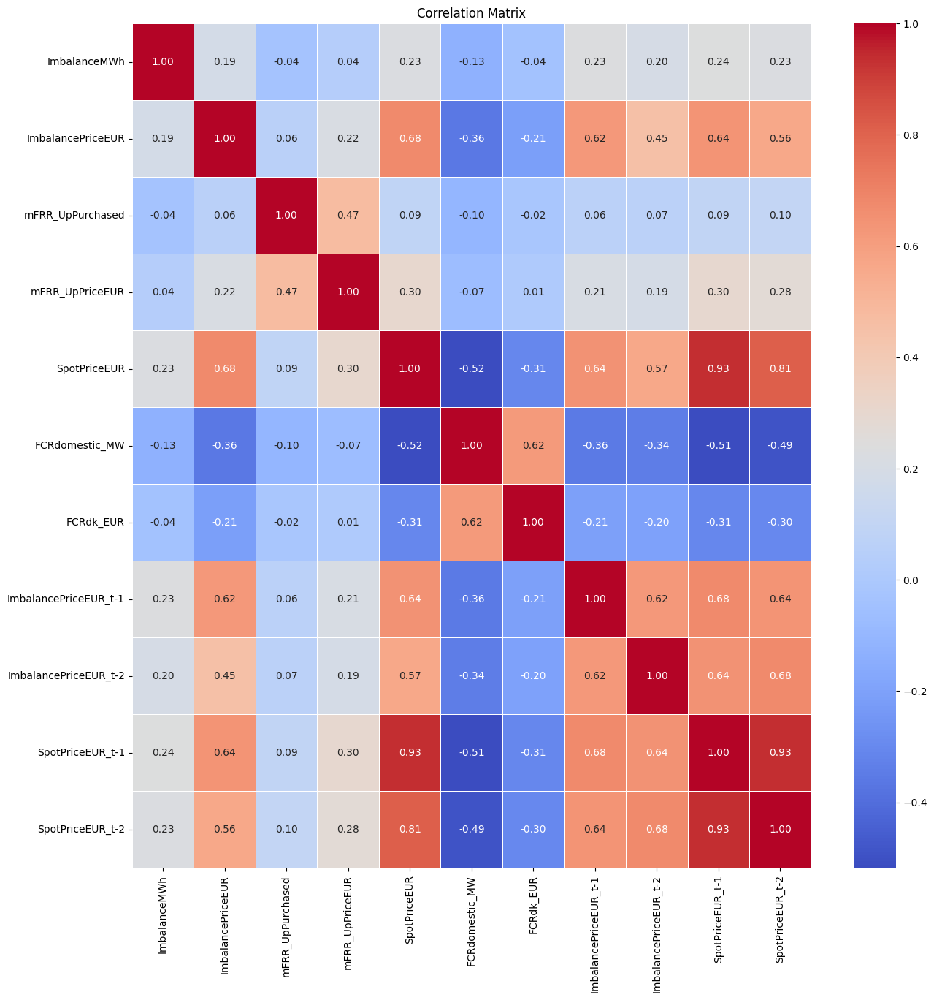

In [24]:
correlation_matrix = df_work.corr(method="pearson")
plt.figure(figsize=(15, 15))  
sns.heatmap(correlation_matrix, annot=True, fmt=".2f",linewidths=0.5,cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()

array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >], dtype=object)

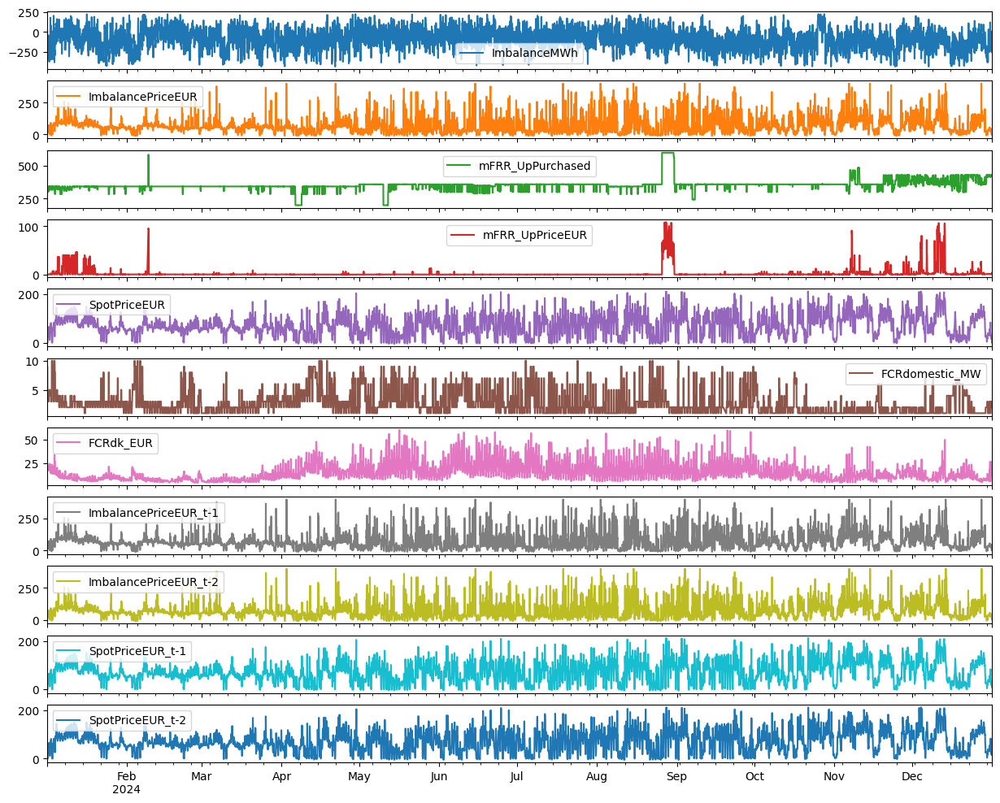

In [25]:
df_work.plot(subplots=True, figsize=(15, 12))

# 1. LINEAR MODEL

In [26]:
bi_weekly_dir_LS = split_biweekly_train_test(df_work)
monthly_dir_LS = split_monthly_train_test(df_work)
quarterly_dir_LS = split_quarterly_train_test(df_work)

target_col_LS = 'ImbalancePriceEUR'

Total periods: 26
2024-01-01_to_2024-01-15: Train = 336, Test = 24
2024-01-15_to_2024-01-29: Train = 336, Test = 24
2024-01-29_to_2024-02-12: Train = 336, Test = 24
2024-02-12_to_2024-02-26: Train = 336, Test = 24
2024-02-26_to_2024-03-11: Train = 336, Test = 24
2024-03-11_to_2024-03-25: Train = 336, Test = 24
2024-03-25_to_2024-04-08: Train = 336, Test = 24
2024-04-08_to_2024-04-22: Train = 336, Test = 24
2024-04-22_to_2024-05-06: Train = 336, Test = 24
2024-05-06_to_2024-05-20: Train = 336, Test = 24
2024-05-20_to_2024-06-03: Train = 336, Test = 24
2024-06-03_to_2024-06-17: Train = 336, Test = 24
2024-06-17_to_2024-07-01: Train = 336, Test = 24
2024-07-01_to_2024-07-15: Train = 336, Test = 24
2024-07-15_to_2024-07-29: Train = 336, Test = 24
2024-07-29_to_2024-08-12: Train = 336, Test = 24
2024-08-12_to_2024-08-26: Train = 336, Test = 24
2024-08-26_to_2024-09-09: Train = 336, Test = 24
2024-09-09_to_2024-09-23: Train = 336, Test = 24
2024-09-23_to_2024-10-07: Train = 336, Test = 24
20

## Bi-weekly

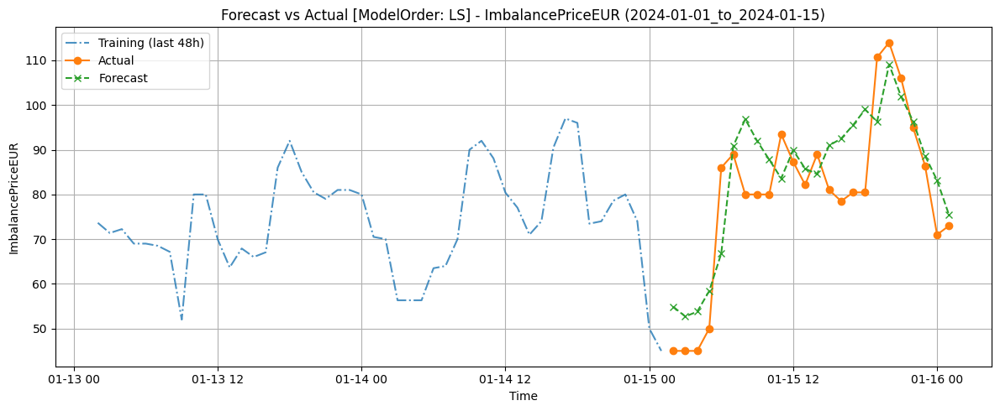

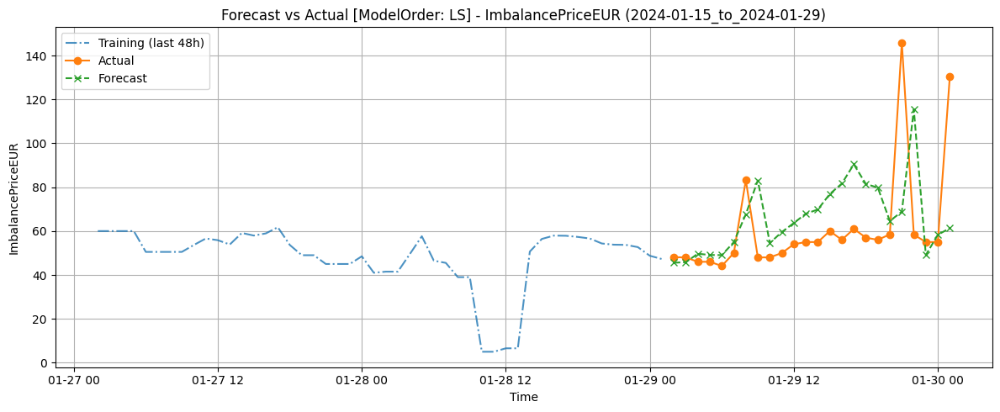

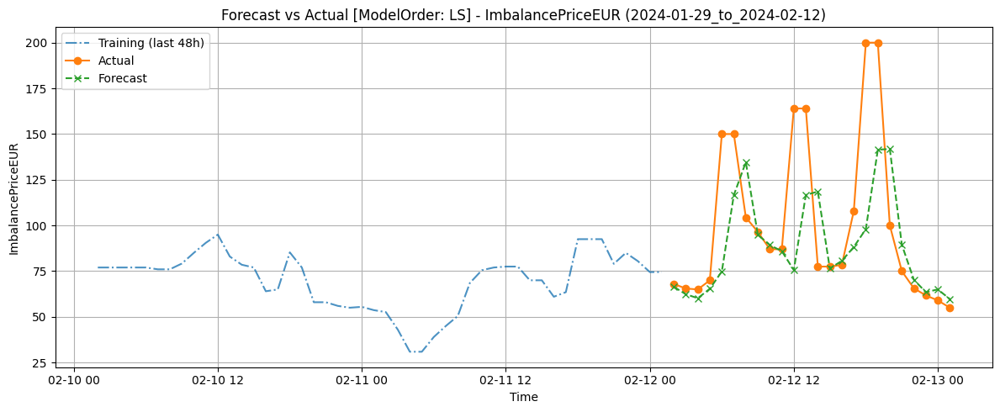

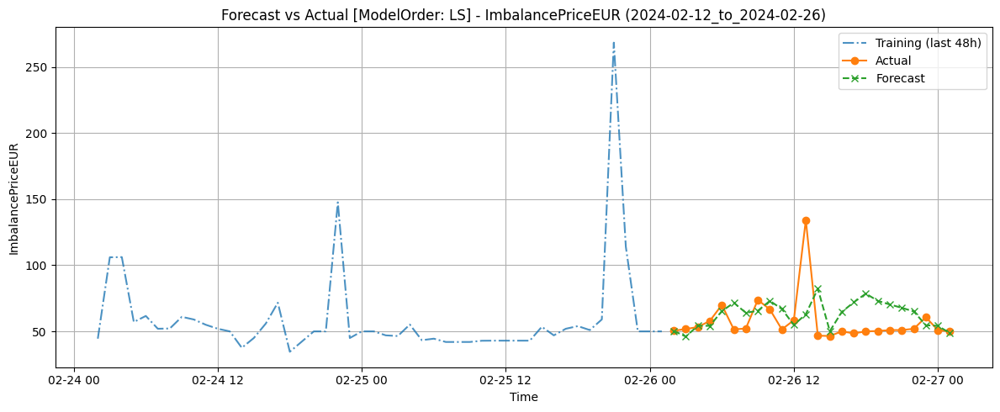

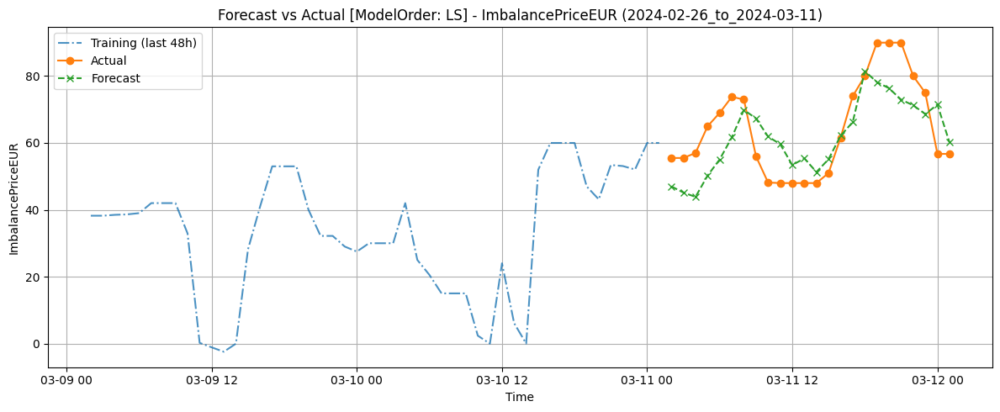

...

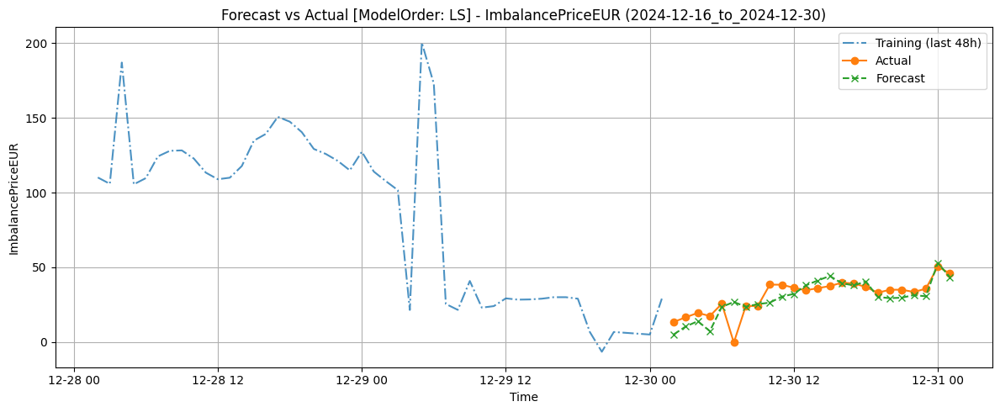

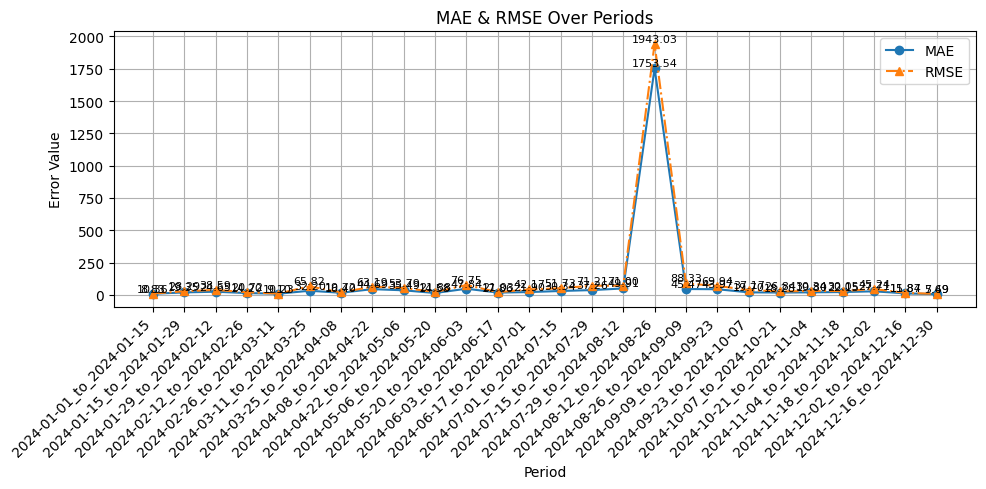

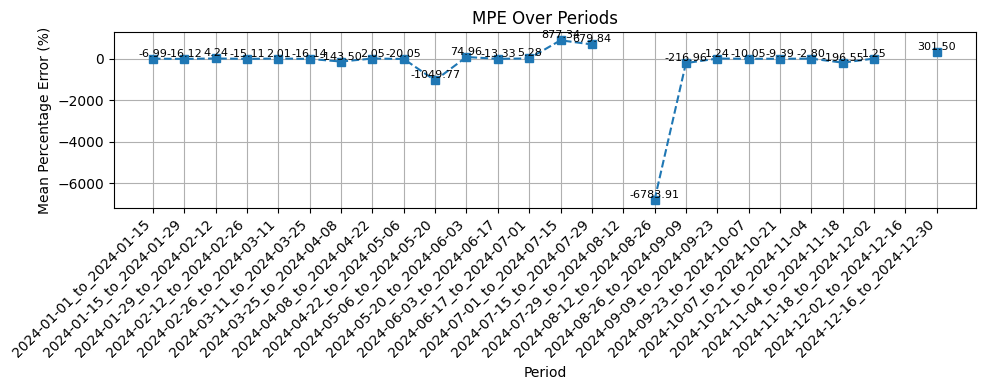

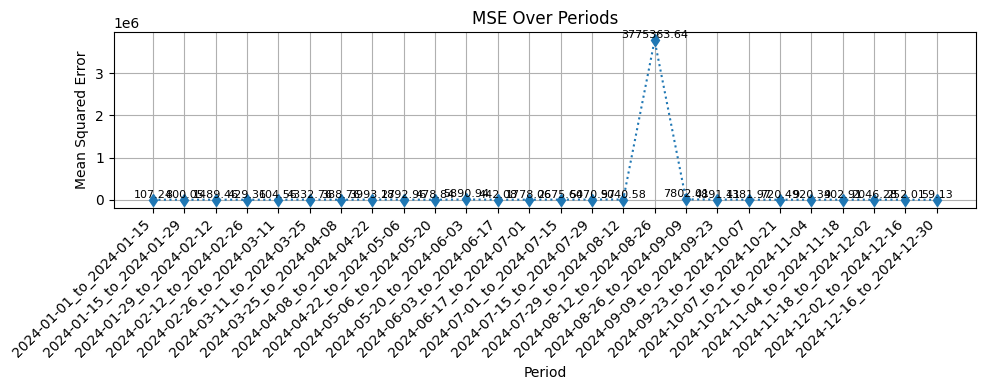

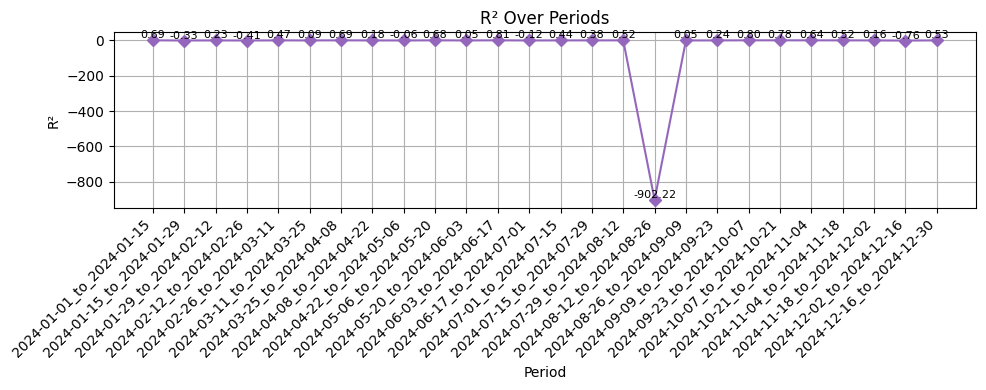

Average metrics across all periods:
  MAE   : 92.0204
  MSE   : 147317.5236
  RMSE  : 113.8831
  R2    : -34.4217
  MPE   : nan


c:\Users\zivot\OneDrive - Danmarks Tekniske Universitet\Skrivebord\DTU\Year 3\6th_semester\Thesis_project\.venv\Lib\site-packages\numpy\_core\_methods.py:53: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


In [27]:
metrics_Bi_weekly_LS = {}
for i in range(len(bi_weekly_dir_LS['period'])):
    period = bi_weekly_dir_LS['period'][i]
    train_df = bi_weekly_dir_LS['train'][i]
    test_df  = bi_weekly_dir_LS['test'][i]

    

    X_train = sm.add_constant(train_df.drop(columns=[target_col_LS]), has_constant='add')
    y_train = train_df[target_col_LS]

    X_test = sm.add_constant(test_df.drop(columns=[target_col_LS]), has_constant='add')
    y_test = test_df[target_col_LS]

    
    
    model = sm.OLS(y_train, X_train).fit()
    
    
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)


    plot_forecast_vs_actual(train_df,test_df,forecast=y_test_pred,column=target_col_LS,period_label=period, model_order='LS')

    metrics_Bi_weekly_LS[str(period)] = evaluate_model(y_test, y_test_pred)



metrics_plot(metrics_Bi_weekly_LS)
avr_metrics = avg_metrics(metrics_Bi_weekly_LS)


25.55976940041744 40.71725786460102


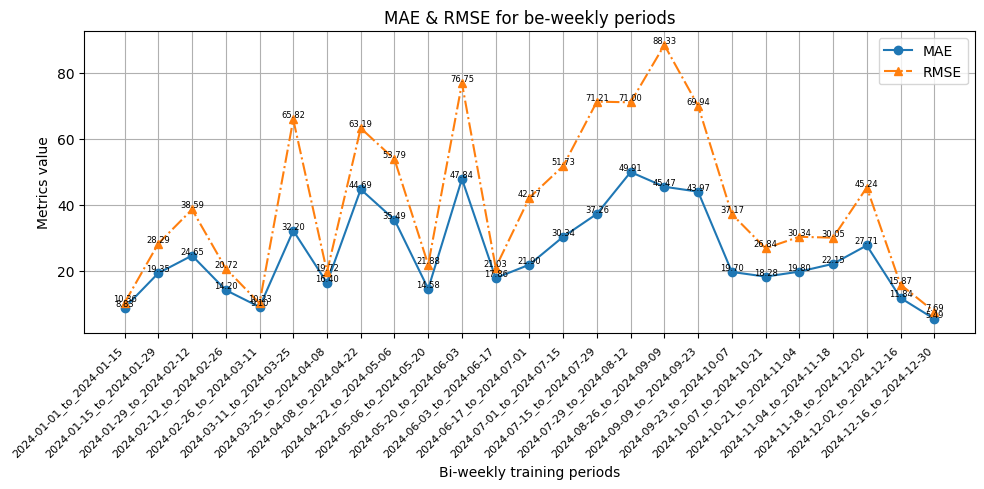

In [28]:
a = pd.DataFrame.from_dict(metrics_Bi_weekly_LS, orient='index')
#a.index.name = 'Period'
mae_olsbw= a['MAE']
rmse_olsbw= a['RMSE']

mae_olsbw = mae_olsbw.drop('2024-08-12_to_2024-08-26')
rmse_olsbw = rmse_olsbw.drop('2024-08-12_to_2024-08-26')
print(np.mean(mae_olsbw), np.mean(rmse_olsbw))
plt.figure(figsize=(10, 5))
plt.plot(mae_olsbw.index, mae_olsbw.values,   marker='o', linestyle='-',  label='MAE')
plt.plot(rmse_olsbw.index, rmse_olsbw.values, marker='^', linestyle='-.', label='RMSE')

for i, (m, r) in enumerate(zip(mae_olsbw.values, rmse_olsbw.values)):
    plt.text(mae_olsbw.index[i],   m, f'{m:.2f}', ha='center', va='bottom', fontsize=6)
    plt.text(rmse_olsbw.index[i],  r, f'{r:.2f}', ha='center', va='bottom', fontsize=6)

# Shrink x‐tick labels
plt.xticks(
    rotation=45,
    ha='right',
    fontsize=8,      # make tick labels smaller
    minor=False
)

# If you want to move them a bit away from the axis:
plt.gca().tick_params(axis='x', pad=5)  # increase vertical distance

plt.xlabel('Bi-weekly training periods')
plt.ylabel('Metrics value')
plt.title('MAE & RMSE for be-weekly periods')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Original periods: 26
Kept after clipping tails [1%,99%]: 20


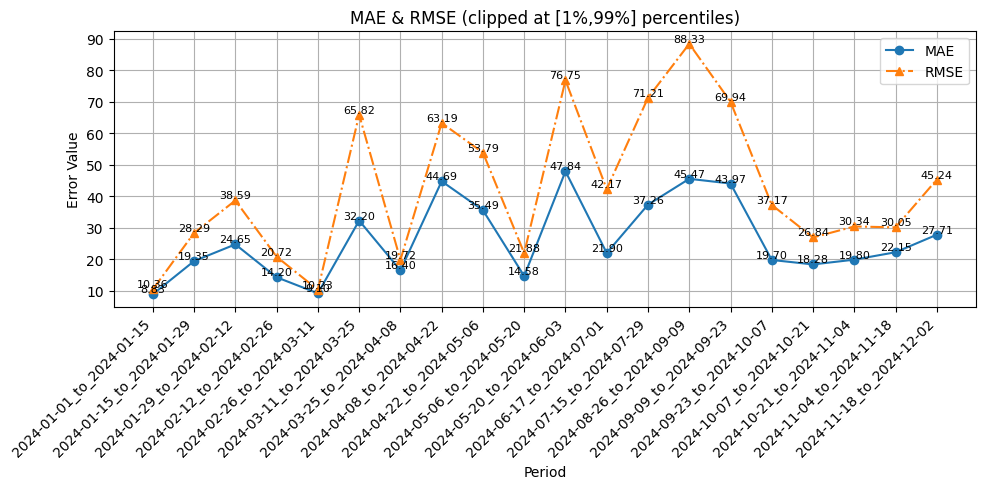

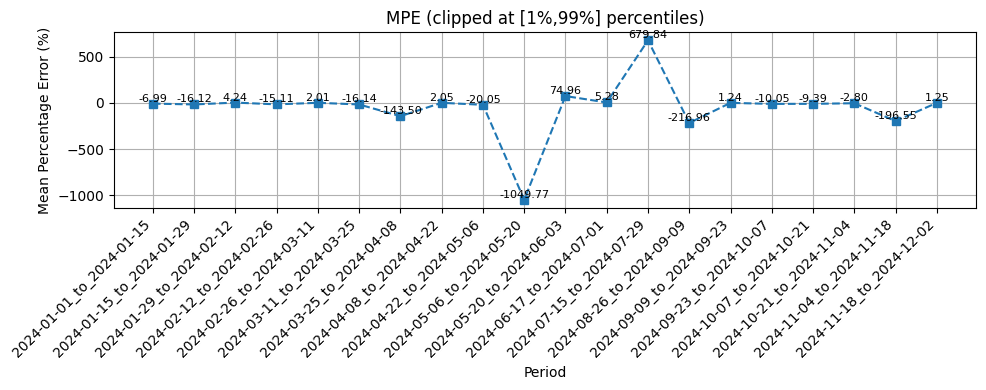

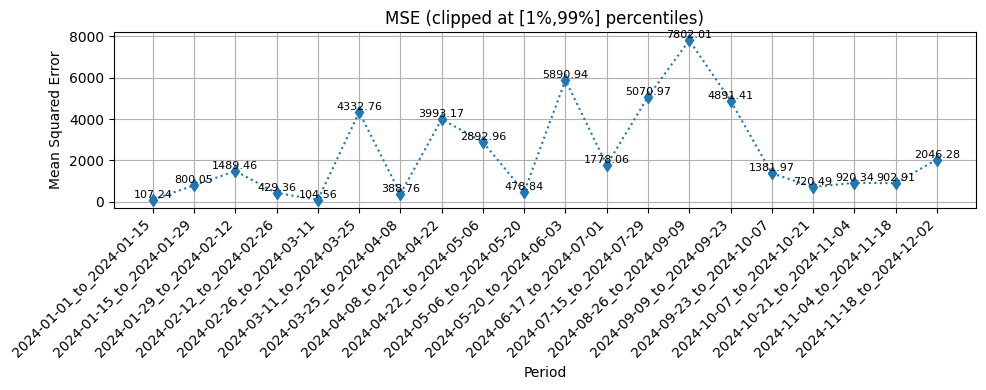

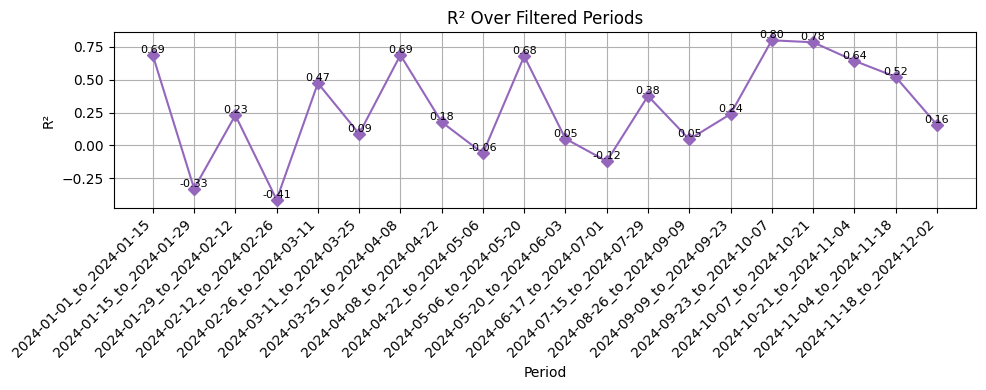

Original periods: 26
Kept after clipping [1%,99%]: 20

Average metrics on cleaned data:
  MAE   : 26.1784
  MSE   : 2321.1264
  RMSE  : 42.5309
  R2    : 0.2857
  MPE   : -46.6275


{'MAE': 26.17838421318669,
 'MSE': 2321.126360276744,
 'RMSE': 42.530884529109045,
 'R2': 0.2857421907254082,
 'MPE': -46.62752718861524}

In [29]:
metrics_filter_outliers_plot(metrics_Bi_weekly_LS, pct=0.99)
metrics_filter_outliers_avg(metrics_Bi_weekly_LS, lower_pct=0.01, upper_pct=0.99)

## Monthly

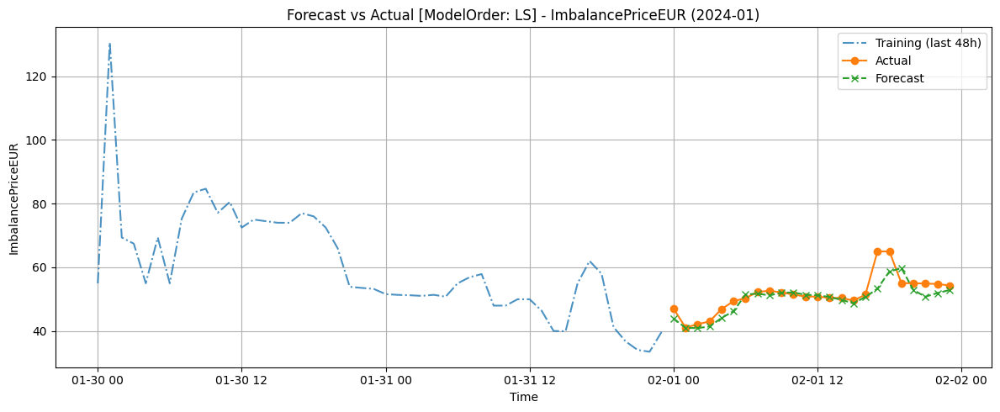

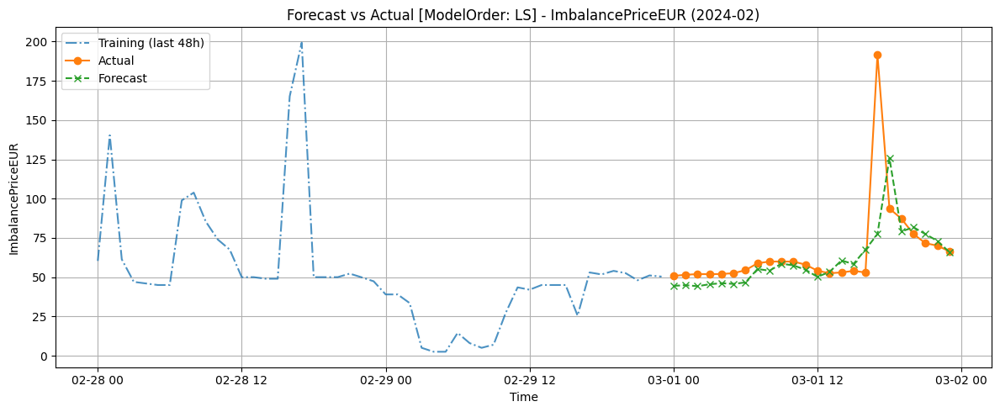

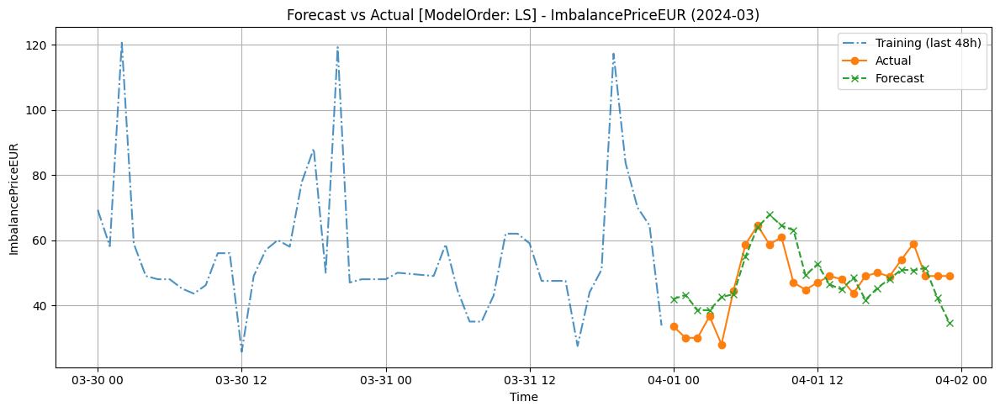

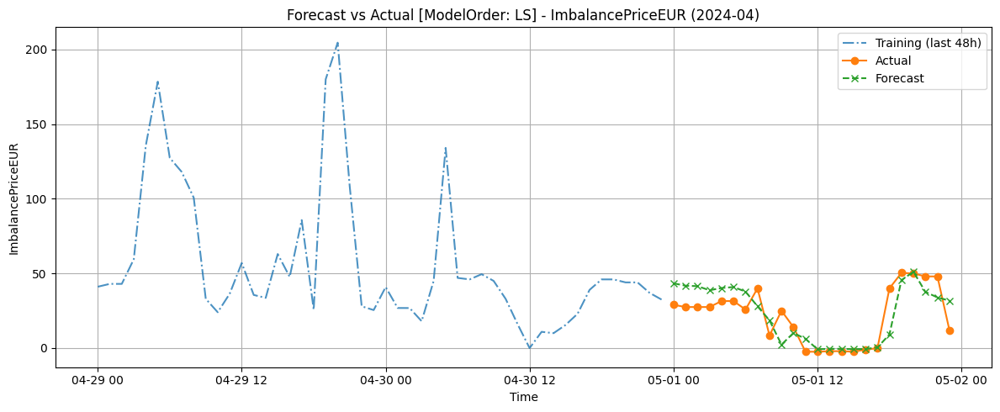

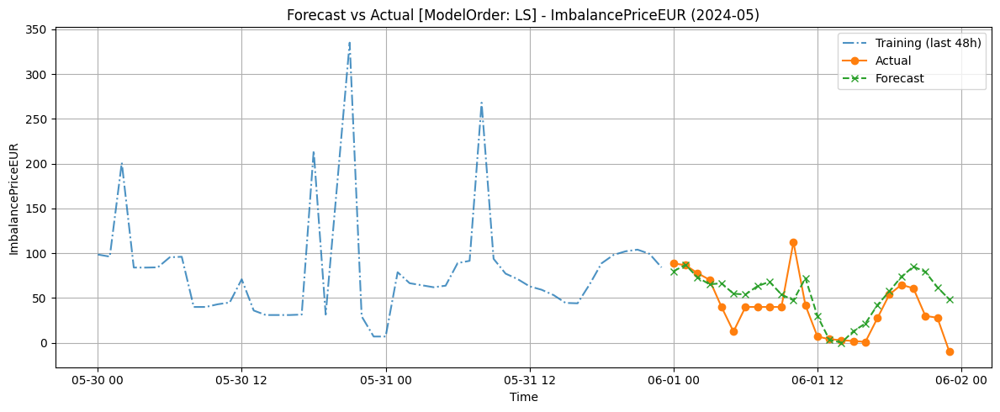

...

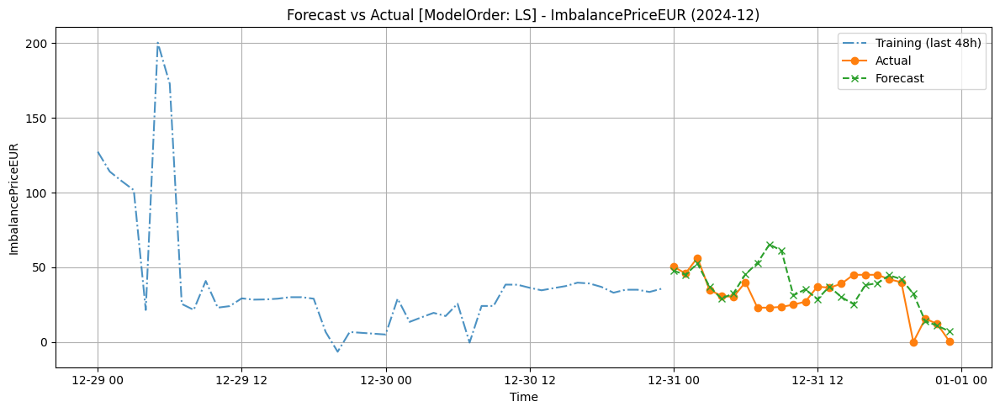

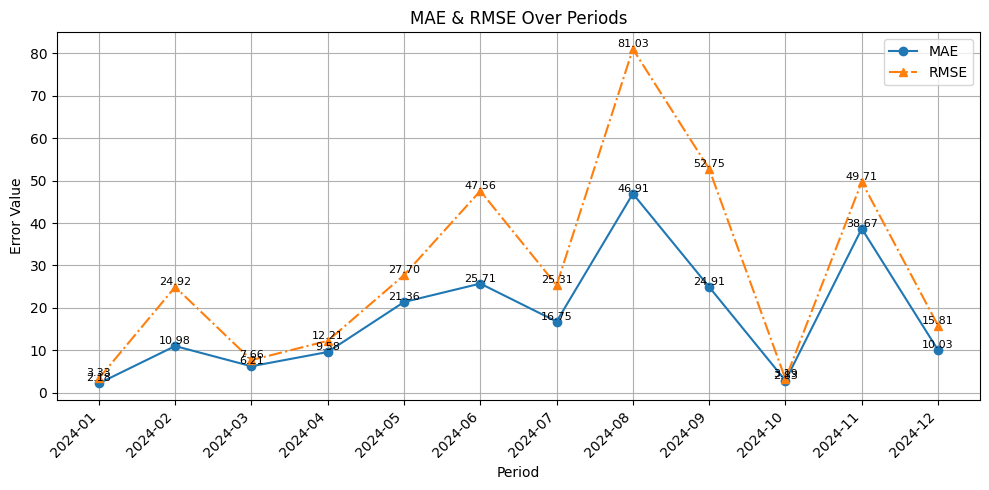

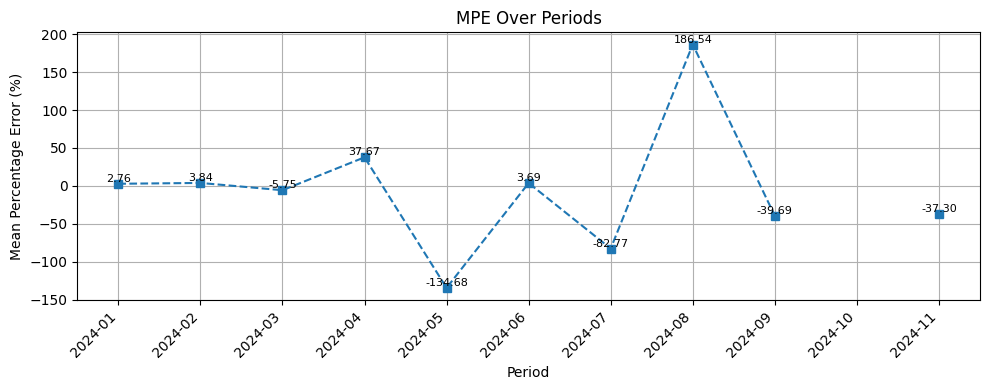

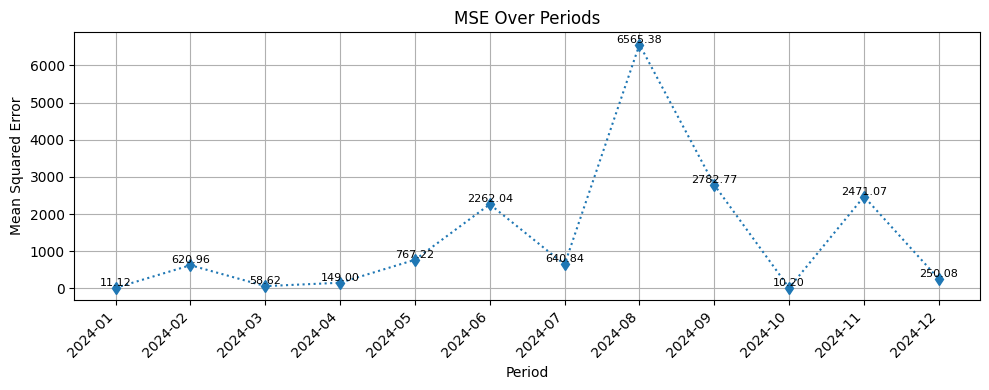

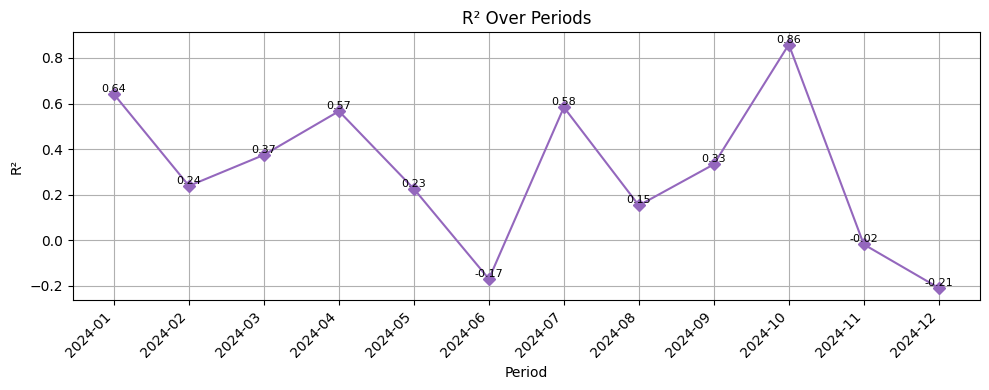

Average metrics across all periods:
  MAE   : 18.0097
  MSE   : 1382.4425
  RMSE  : 29.2657
  R2    : 0.2980
  MPE   : -inf


In [30]:
metrics_Monthly_LS = {}
for i in range(len(monthly_dir_LS['period'])):
    period = monthly_dir_LS['period'][i]
    train_df = monthly_dir_LS['train'][i]
    test_df  = monthly_dir_LS['test'][i]

    

    X_train = sm.add_constant(train_df.drop(columns=[target_col_LS]), has_constant='add')
    y_train = train_df[target_col_LS]

    X_test = sm.add_constant(test_df.drop(columns=[target_col_LS]), has_constant='add')
    y_test = test_df[target_col_LS]

    
    
    model = sm.OLS(y_train, X_train).fit()
    
    
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)


    plot_forecast_vs_actual(train_df,test_df,forecast=y_test_pred,column=target_col_LS,period_label=period, model_order='LS')

    metrics_Monthly_LS[str(period)] = evaluate_model(y_test, y_test_pred)



metrics_plot(metrics_Monthly_LS)
avr_metrics = avg_metrics(metrics_Monthly_LS)


MAE
2024-01     2.179508
2024-02    10.978330
2024-03     6.212809
2024-04     9.577800
2024-05    21.360182
2024-06    25.714009
2024-07    16.754634
2024-08    46.911237
2024-09    24.905246
2024-10     2.829664
2024-11    38.665234
2024-12    10.028069
Name: MAE, dtype: float64
RMSE
2024-01     3.334375
2024-02    24.919154
2024-03     7.656479
2024-04    12.206727
2024-05    27.698799
2024-06    47.560863
2024-07    25.314740
2024-08    81.027028
2024-09    52.751985
2024-10     3.194042
2024-11    49.709861
2024-12    15.814015
Name: RMSE, dtype: float64
18.00972695773367 29.26567227478388


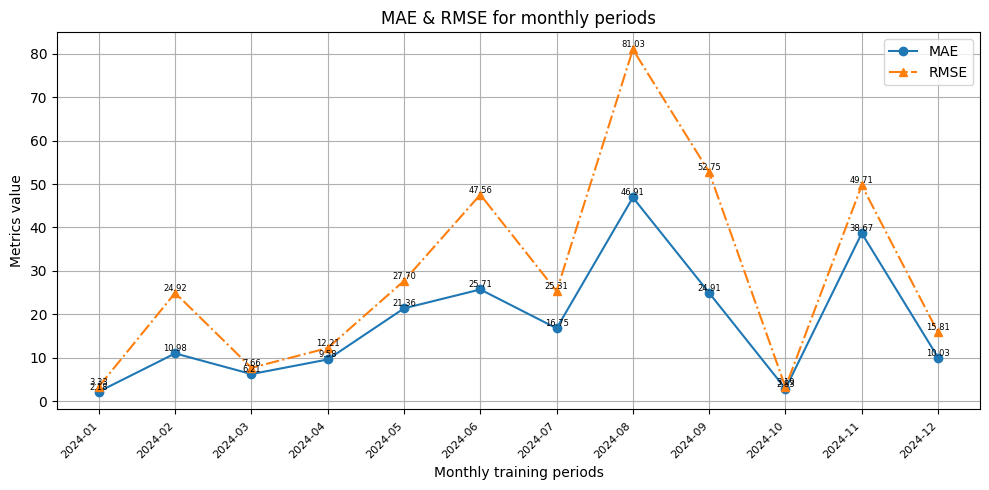

In [31]:
b = pd.DataFrame.from_dict(metrics_Monthly_LS, orient='index')
#print(b)
mae_olsmnt= b['MAE']
rmse_olsmnt= b['RMSE']
print('MAE')
print(mae_olsmnt)
print('RMSE')
print(rmse_olsmnt)

print(np.mean(mae_olsmnt), np.mean(rmse_olsmnt))
plt.figure(figsize=(10, 5))
plt.plot(mae_olsmnt.index, mae_olsmnt.values,   marker='o', linestyle='-',  label='MAE')
plt.plot(rmse_olsmnt.index, rmse_olsmnt.values, marker='^', linestyle='-.', label='RMSE')

for i, (m, r) in enumerate(zip(mae_olsmnt.values, rmse_olsmnt.values)):
    plt.text(mae_olsmnt.index[i],   m, f'{m:.2f}', ha='center', va='bottom', fontsize=6)
    plt.text(rmse_olsmnt.index[i],  r, f'{r:.2f}', ha='center', va='bottom', fontsize=6)

# Shrink x‐tick labels
plt.xticks(
    rotation=45,
    ha='right',
    fontsize=8,      # make tick labels smaller
    minor=False
)

# If you want to move them a bit away from the axis:
plt.gca().tick_params(axis='x', pad=5)  # increase vertical distance

plt.xlabel('Monthly training periods')
plt.ylabel('Metrics value')
plt.title('MAE & RMSE for monthly periods')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


## Quarterly

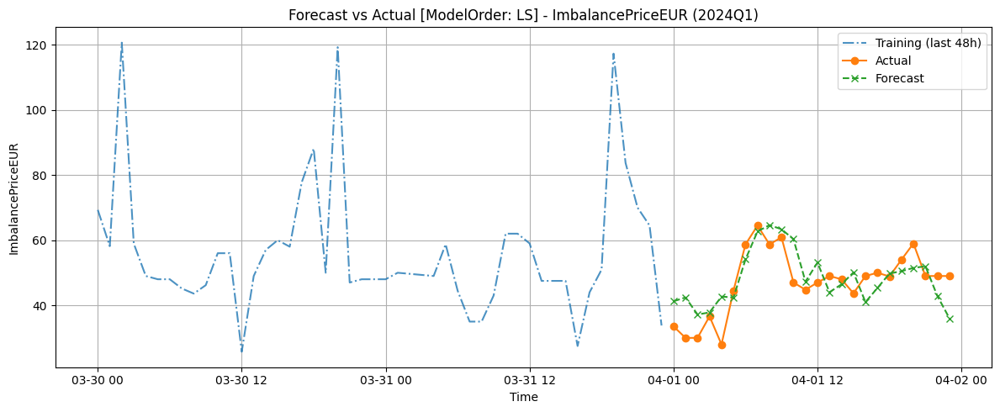

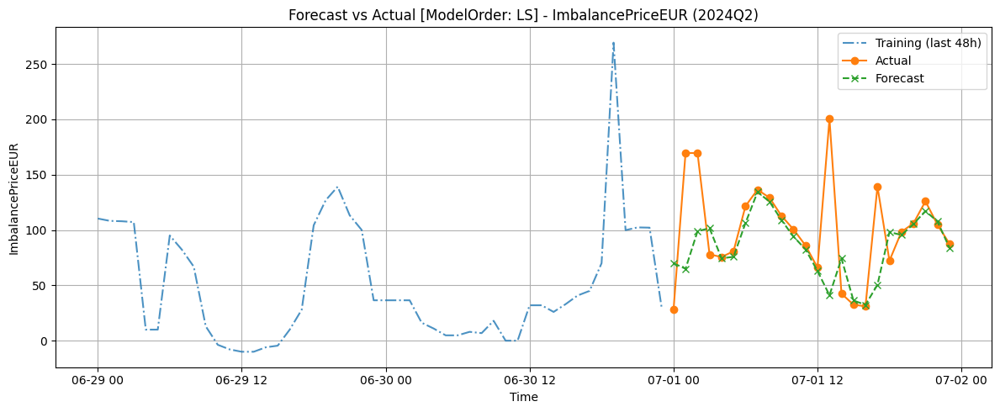

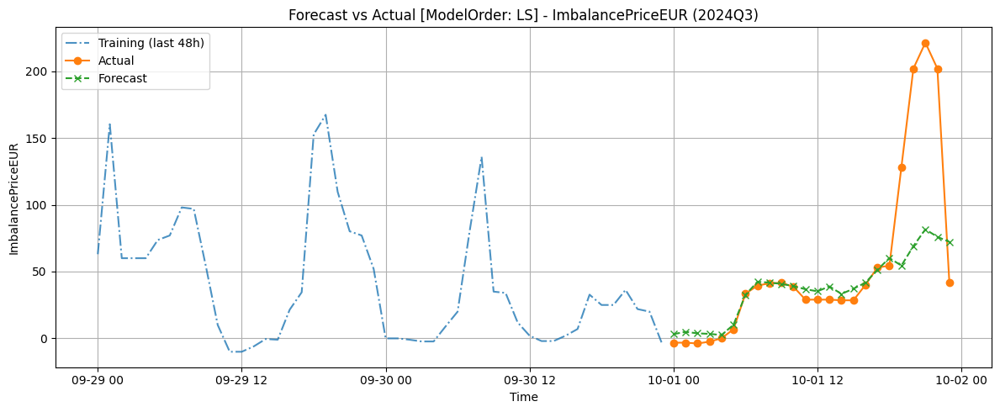

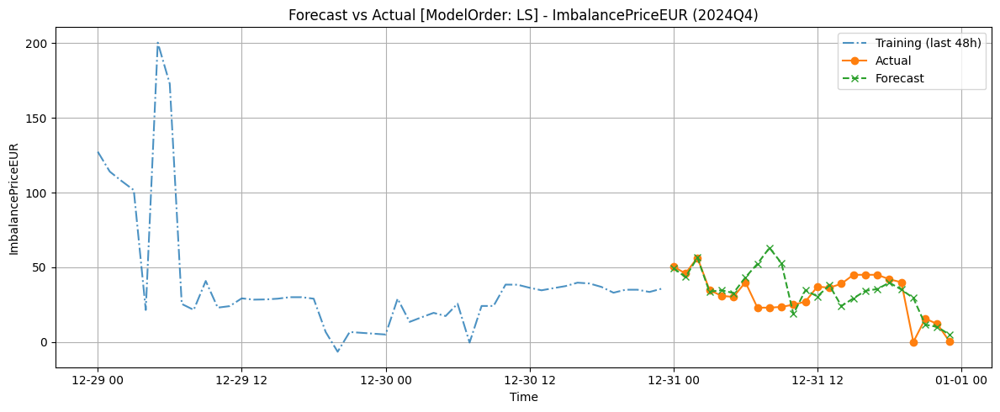

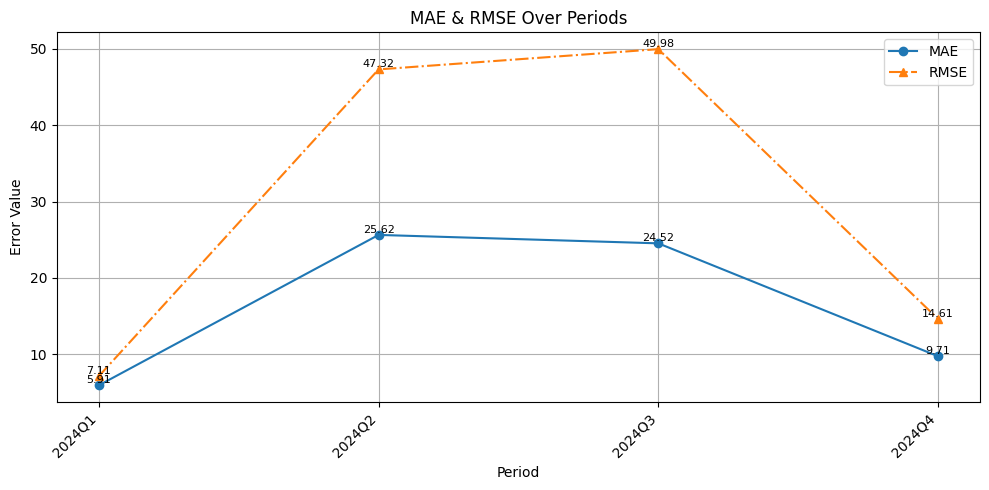

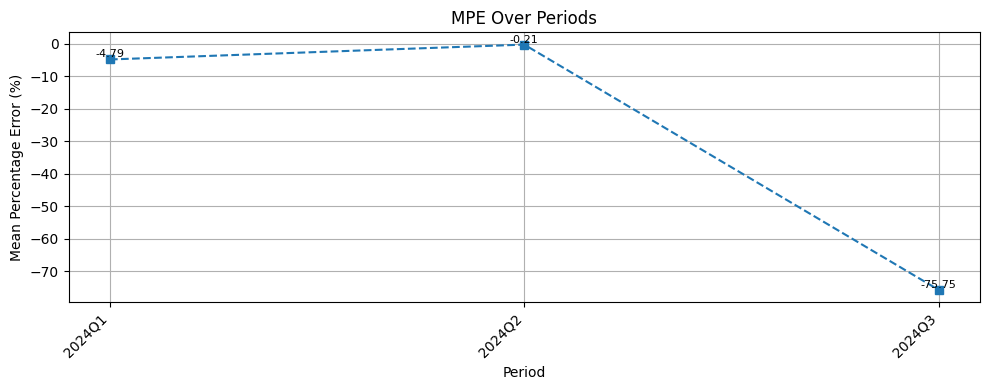

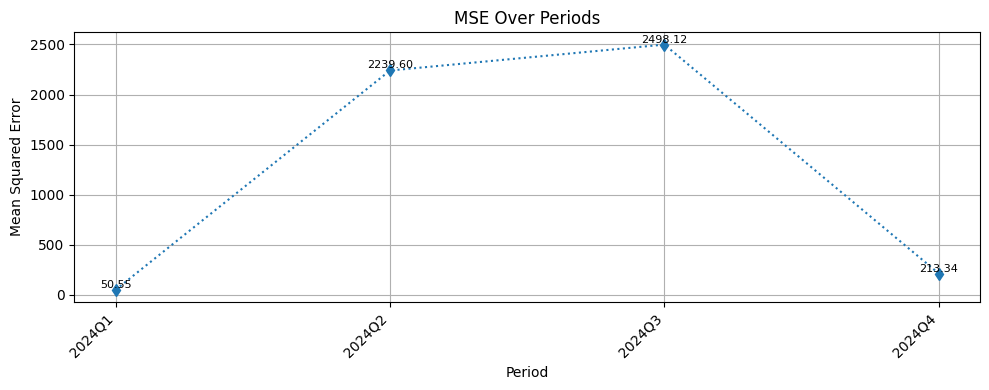

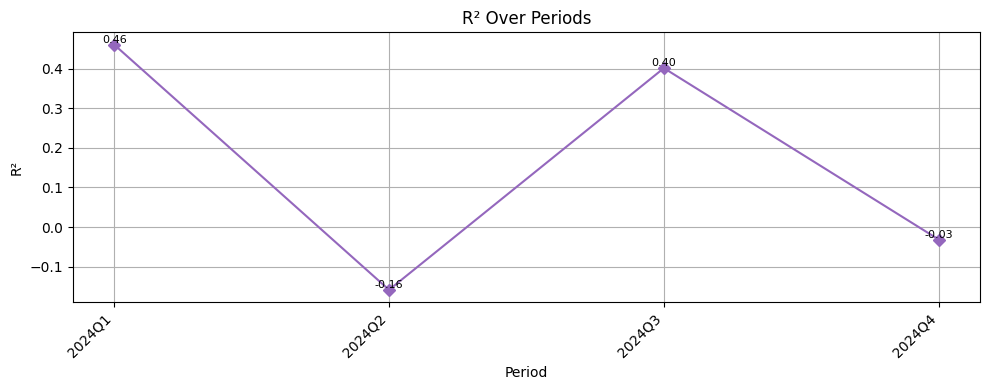

Average metrics across all periods:
  MAE   : 16.4409
  MSE   : 1250.4015
  RMSE  : 29.7554
  R2    : 0.1679
  MPE   : -inf


In [32]:
metrics_Quarterly_LS = {}
for i in range(len(quarterly_dir_LS['period'])):
    period = quarterly_dir_LS['period'][i]
    train_df = quarterly_dir_LS['train'][i]
    test_df  = quarterly_dir_LS['test'][i]

    

    X_train = sm.add_constant(train_df.drop(columns=[target_col_LS]), has_constant='add')
    y_train = train_df[target_col_LS]

    X_test = sm.add_constant(test_df.drop(columns=[target_col_LS]), has_constant='add')
    y_test = test_df[target_col_LS]

    
    
    model = sm.OLS(y_train, X_train).fit()
    
    
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)


    plot_forecast_vs_actual(train_df,test_df,forecast=y_test_pred,column=target_col_LS,period_label=period, model_order='LS')

    metrics_Quarterly_LS[str(period)] = evaluate_model(y_test, y_test_pred)



metrics_plot(metrics_Quarterly_LS)
avr_metrics = avg_metrics(metrics_Quarterly_LS)

MAE
2024Q1     5.906794
2024Q2    25.623800
2024Q3    24.518482
2024Q4     9.714526
Name: MAE, dtype: float64
RMSE
2024Q1     7.110088
2024Q2    47.324399
2024Q3    49.981180
2024Q4    14.606009
Name: RMSE, dtype: float64
16.44090044324525 29.75541892043099


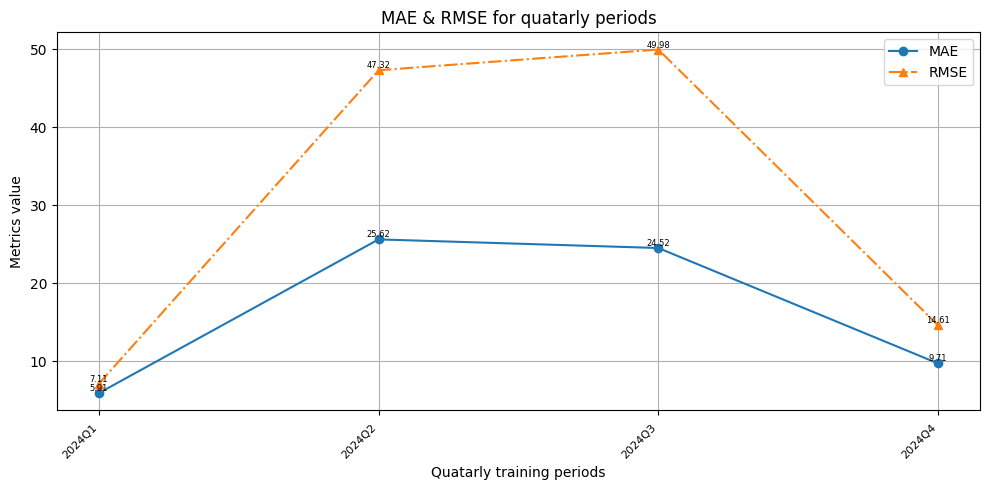

In [48]:
c = pd.DataFrame.from_dict(metrics_Quarterly_LS, orient='index')
#print(b)
mae_olsq= c['MAE']
rmse_olsq= c['RMSE']
print('MAE')
print(mae_olsq)
print('RMSE')
print(rmse_olsq)

print(np.mean(mae_olsq), np.mean(rmse_olsq))
plt.figure(figsize=(10, 5))
plt.plot(mae_olsq.index, mae_olsq.values,   marker='o', linestyle='-',  label='MAE')
plt.plot(rmse_olsq.index, rmse_olsq.values, marker='^', linestyle='-.', label='RMSE')

for i, (m, r) in enumerate(zip(mae_olsq.values, rmse_olsq.values)):
    plt.text(mae_olsq.index[i],   m, f'{m:.2f}', ha='center', va='bottom', fontsize=6)
    plt.text(rmse_olsq.index[i],  r, f'{r:.2f}', ha='center', va='bottom', fontsize=6)

# Shrink x‐tick labels
plt.xticks(
    rotation=45,
    ha='right',
    fontsize=8,      # make tick labels smaller
    minor=False
)

# If you want to move them a bit away from the axis:
plt.gca().tick_params(axis='x', pad=5)  # increase vertical distance

plt.xlabel('Quatarly training periods')
plt.ylabel('Metrics value')
plt.title('MAE & RMSE for quatarly periods')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# 2. VAR - vector(multivariate) auto-reggresive

In [33]:
bi_weekly_dir_VAR = split_biweekly_train_test(df_final_index_NO_diff)
monthly_dir_VAR = split_monthly_train_test(df_final_index_NO_diff)
quarterly_dir_VAR = split_quarterly_train_test(df_final_index_NO_diff)

target_col_VAR = 'ImbalancePriceEUR'

Total periods: 26
2024-01-01_to_2024-01-15: Train = 336, Test = 24
2024-01-15_to_2024-01-29: Train = 336, Test = 24
2024-01-29_to_2024-02-12: Train = 336, Test = 24
2024-02-12_to_2024-02-26: Train = 336, Test = 24
2024-02-26_to_2024-03-11: Train = 336, Test = 24
2024-03-11_to_2024-03-25: Train = 336, Test = 24
2024-03-25_to_2024-04-08: Train = 336, Test = 24
2024-04-08_to_2024-04-22: Train = 336, Test = 24
2024-04-22_to_2024-05-06: Train = 336, Test = 24
2024-05-06_to_2024-05-20: Train = 336, Test = 24
2024-05-20_to_2024-06-03: Train = 336, Test = 24
2024-06-03_to_2024-06-17: Train = 336, Test = 24
2024-06-17_to_2024-07-01: Train = 336, Test = 24
2024-07-01_to_2024-07-15: Train = 336, Test = 24
2024-07-15_to_2024-07-29: Train = 336, Test = 24
2024-07-29_to_2024-08-12: Train = 336, Test = 24
2024-08-12_to_2024-08-26: Train = 336, Test = 24
2024-08-26_to_2024-09-09: Train = 336, Test = 24
2024-09-09_to_2024-09-23: Train = 336, Test = 24
2024-09-23_to_2024-10-07: Train = 336, Test = 24
20

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: []


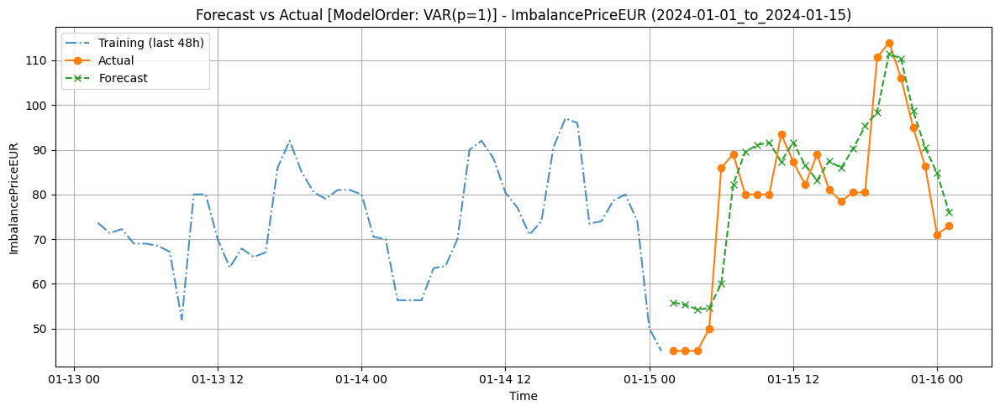

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: []


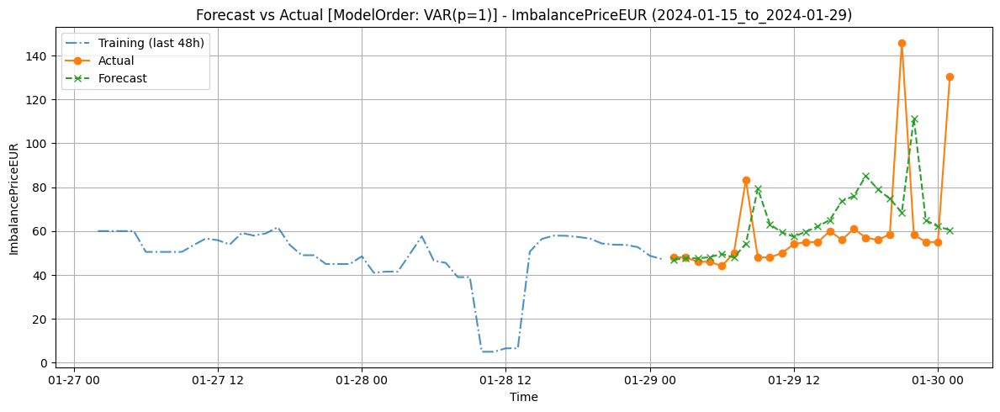

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: []


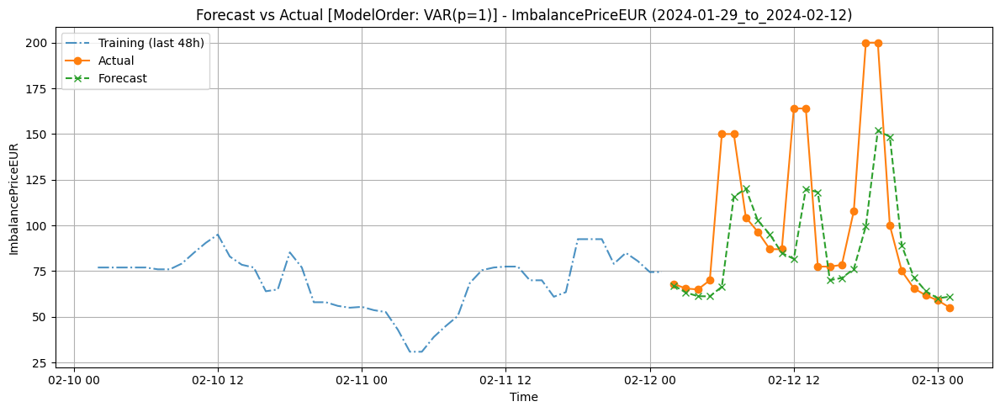

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: ['mFRR_UpPurchased']


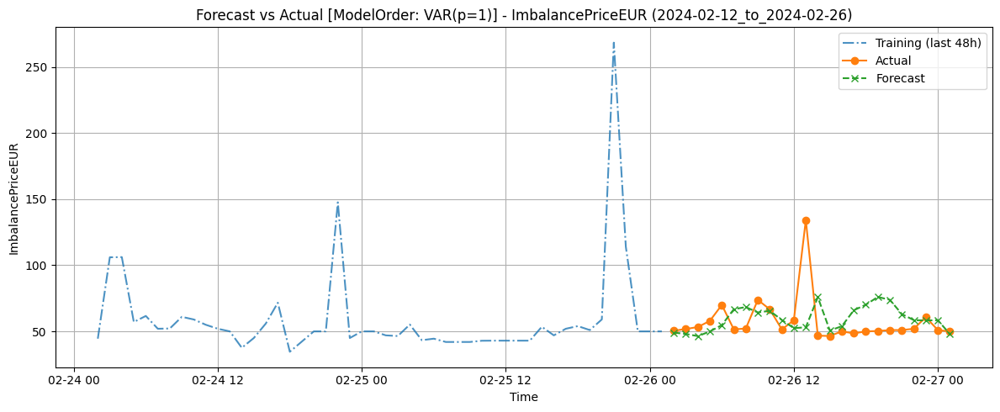

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: ['mFRR_UpPurchased']


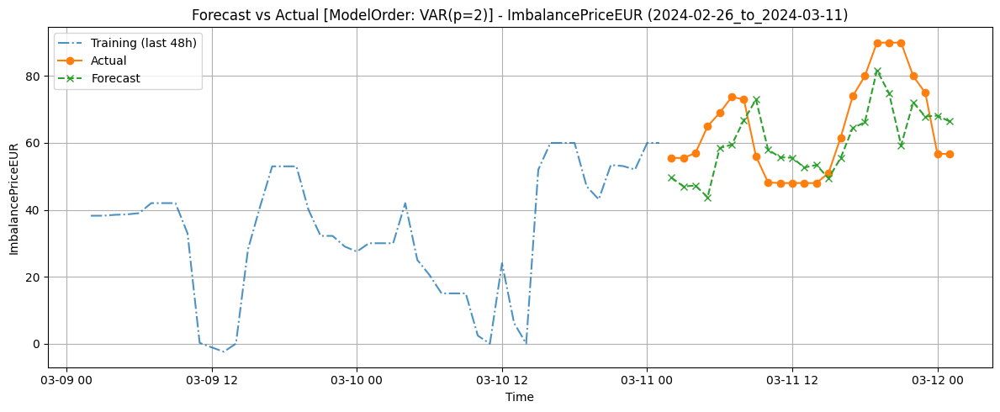

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: []


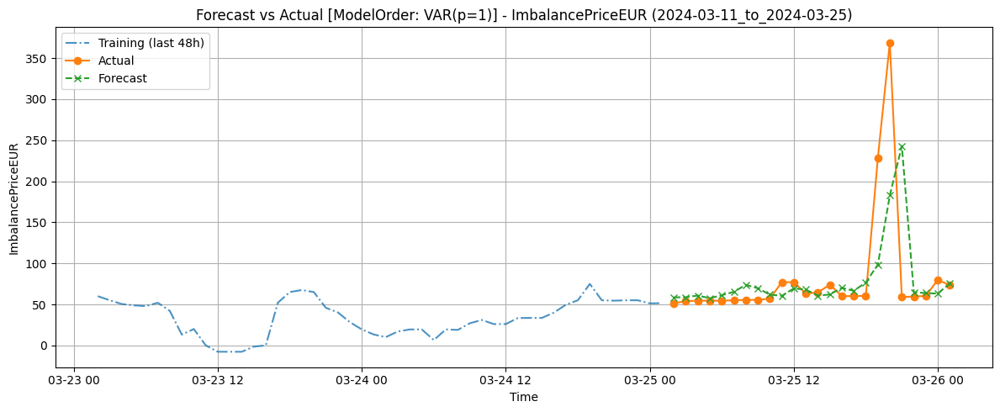

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: []


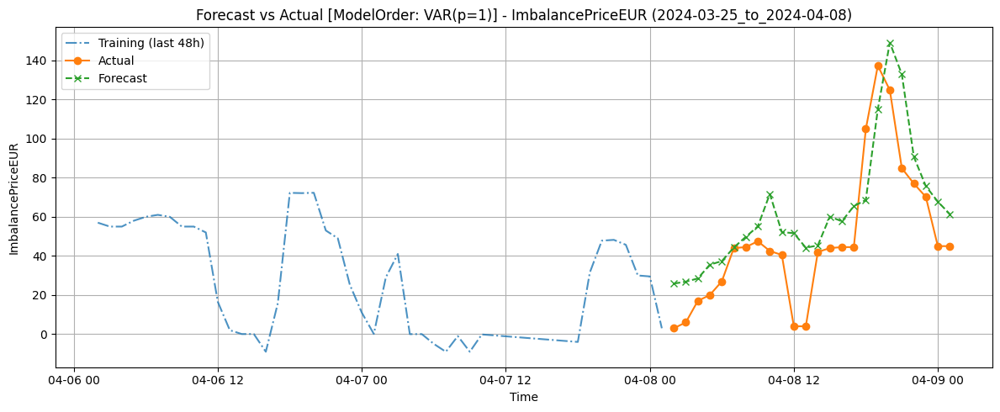

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: []


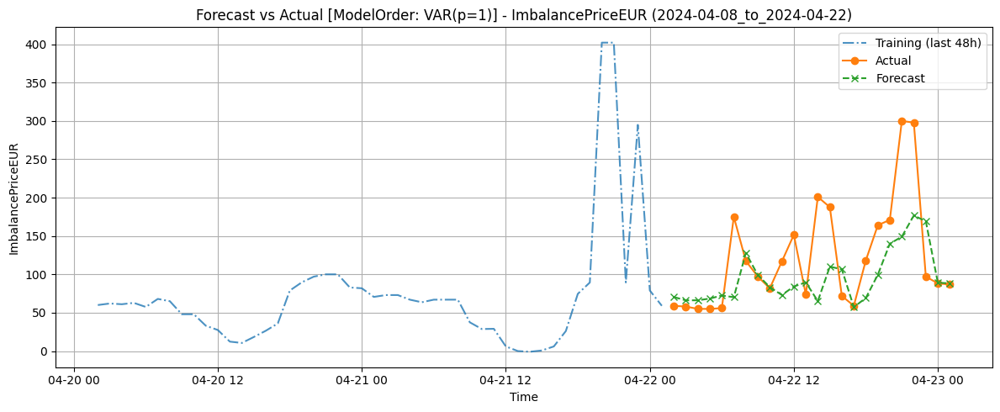

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: []


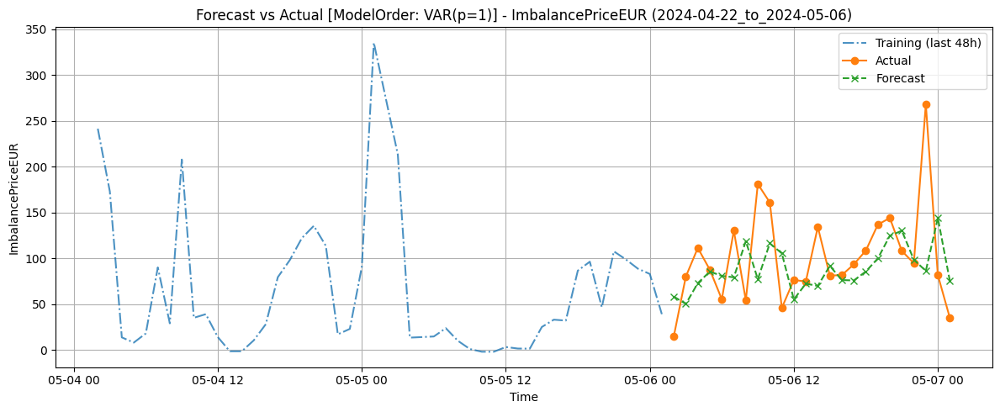

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: []


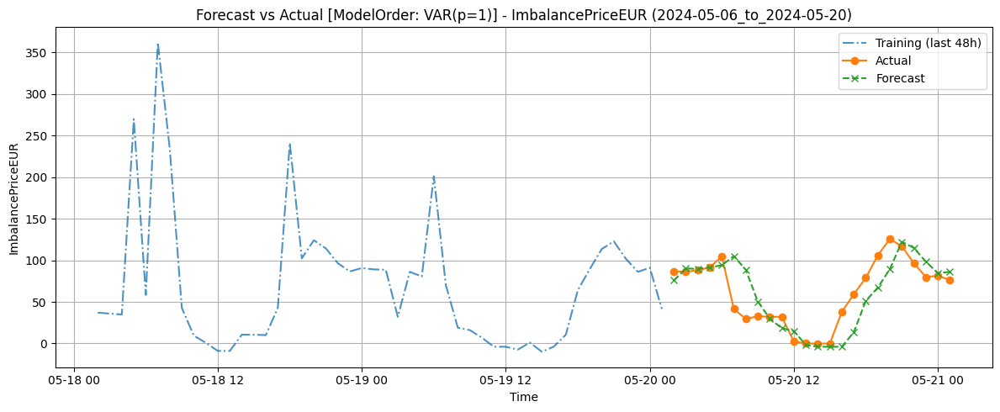

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: []


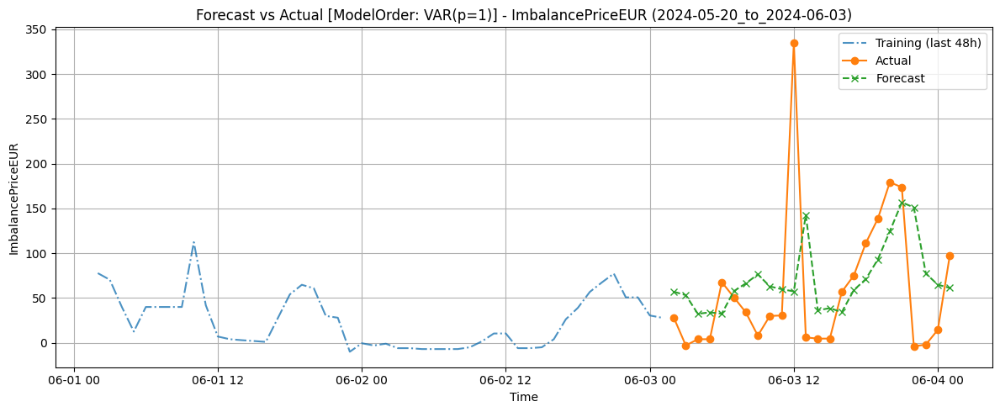

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: []


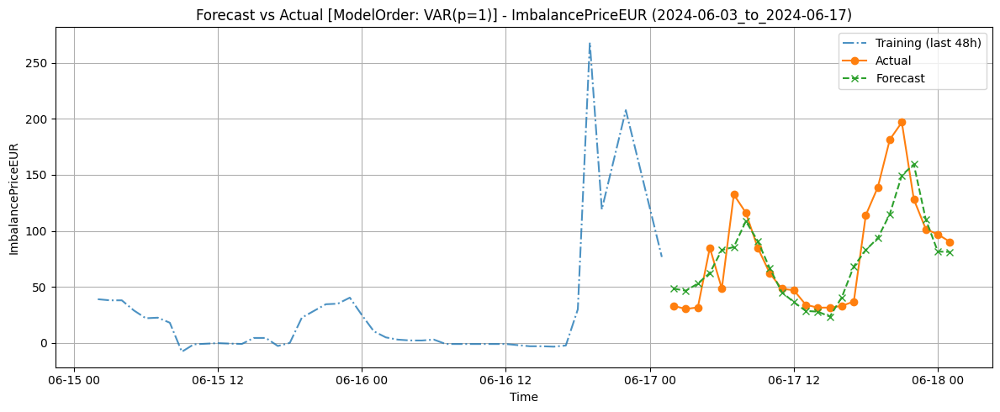

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: []


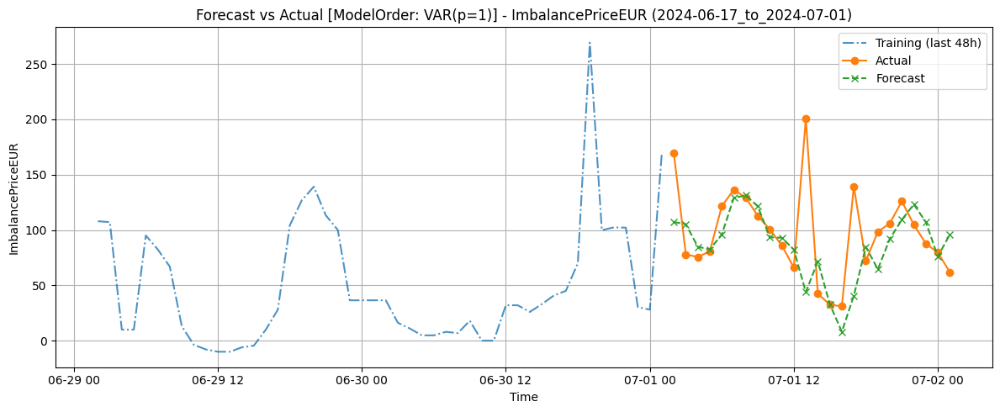

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: []


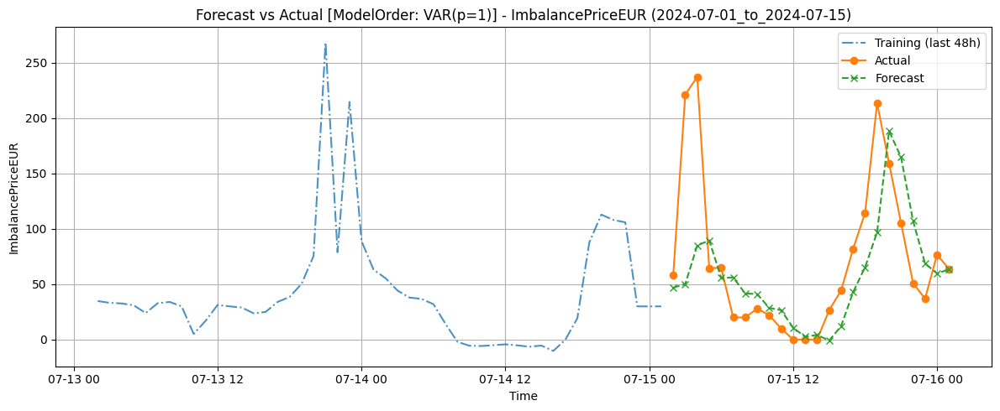

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: []


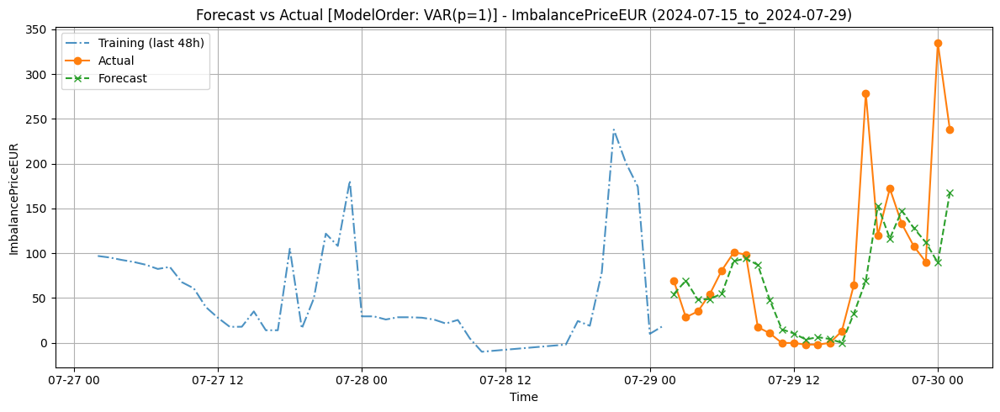

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: []


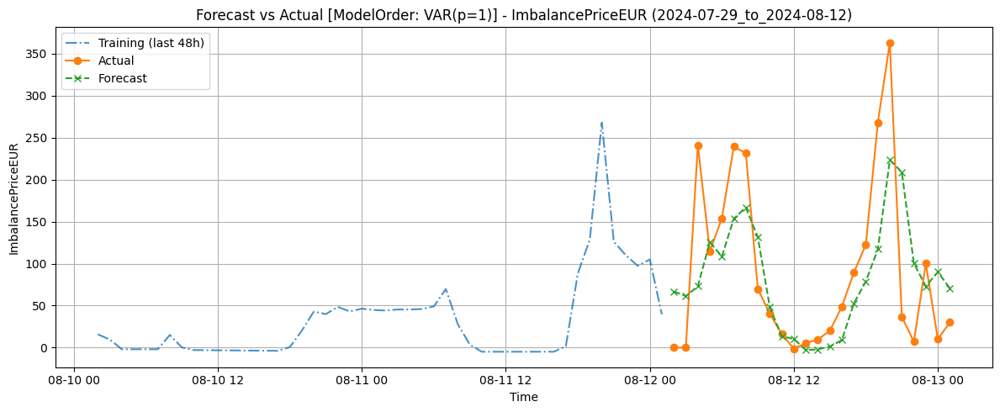

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: []


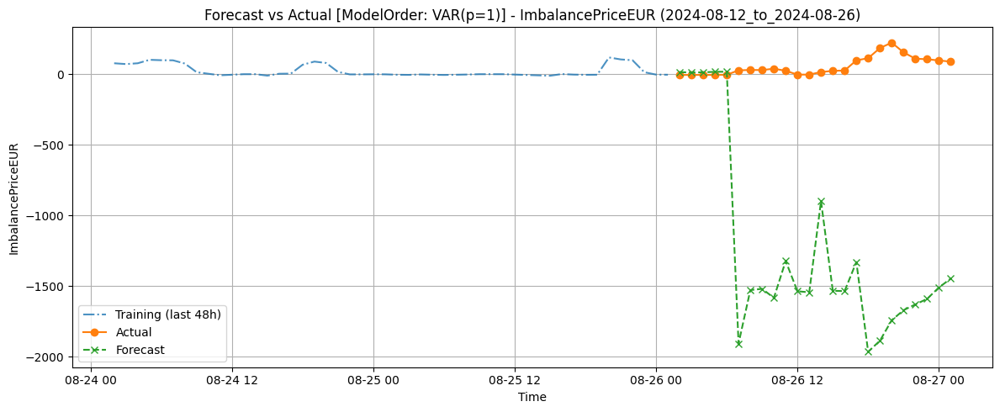

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: []


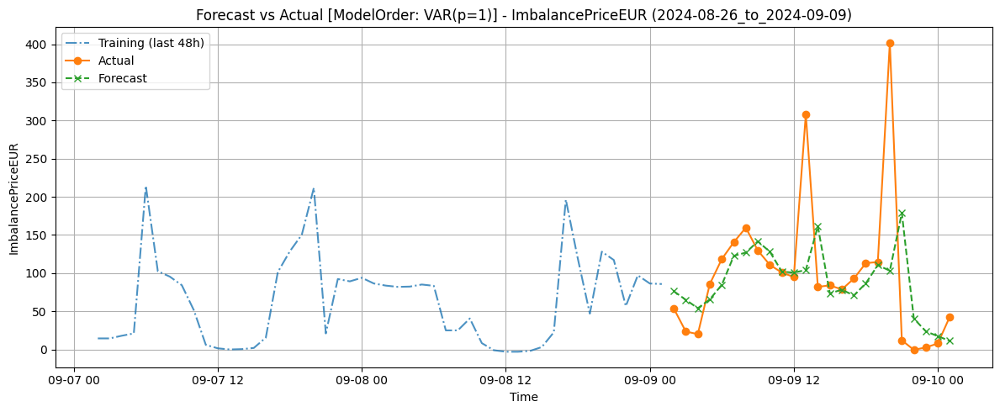

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: []


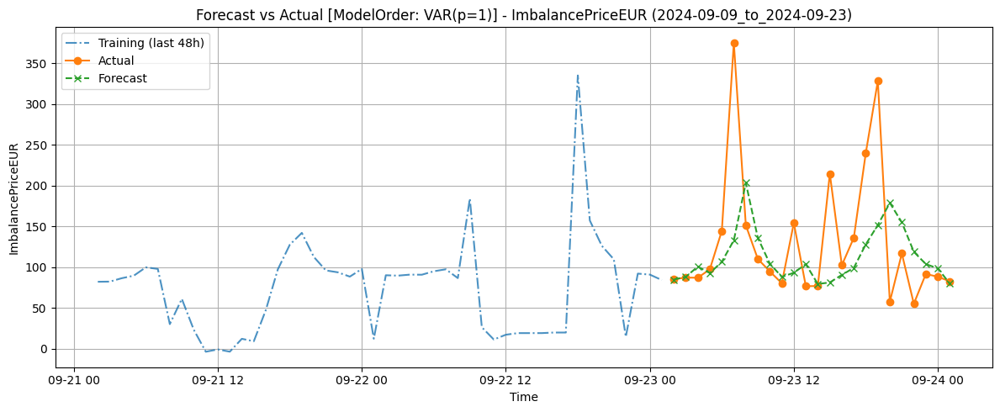

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: []


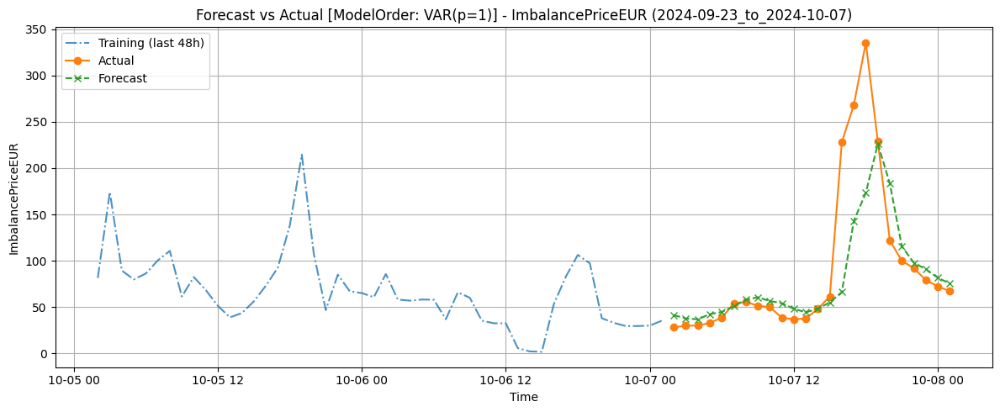

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: []


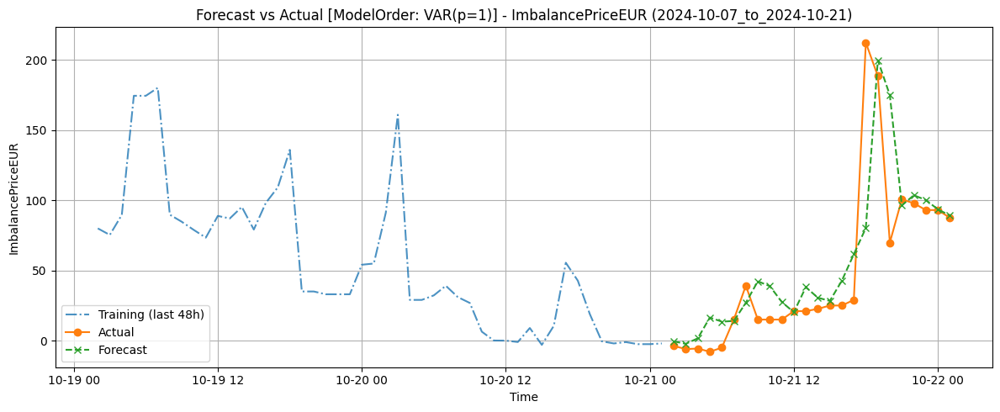

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: ['FCRdomestic_MW']


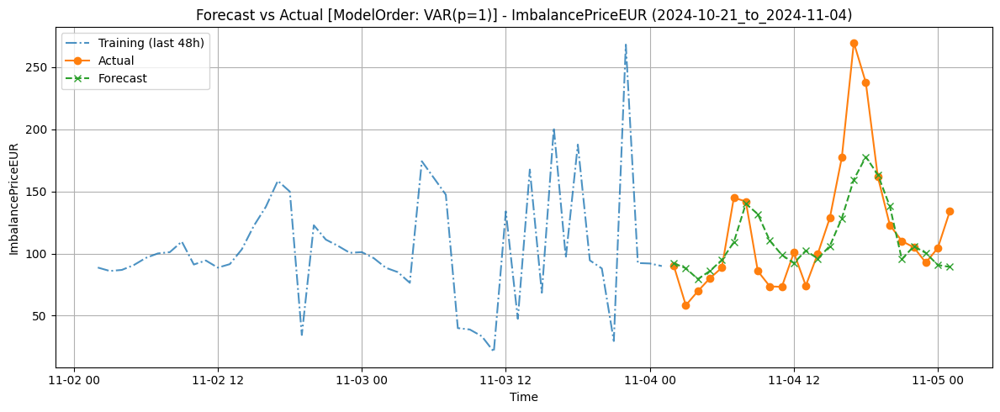

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: ['FCRdomestic_MW']


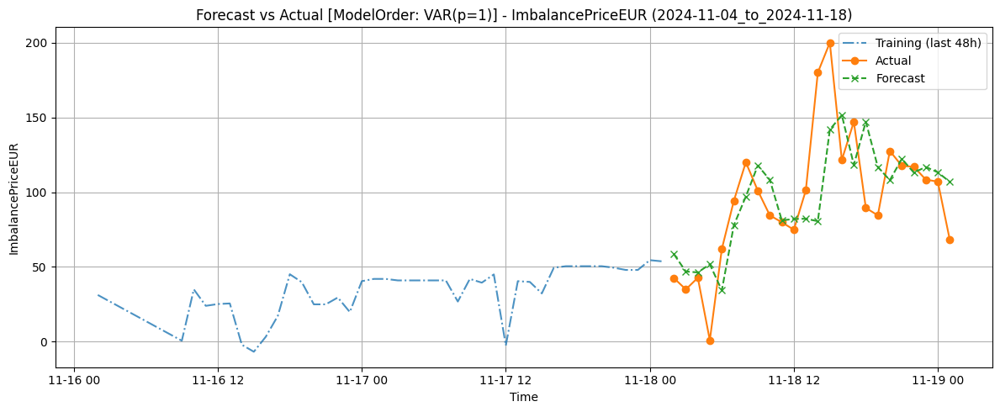

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: ['FCRdomestic_MW']


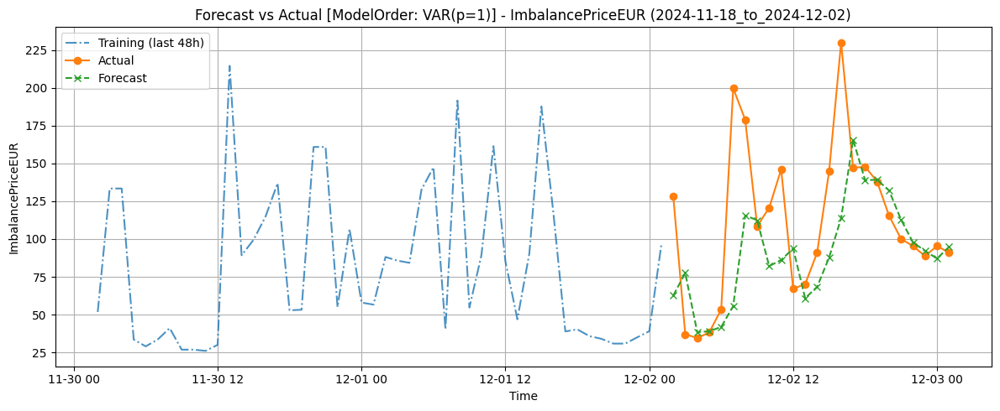

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: ['FCRdomestic_MW']


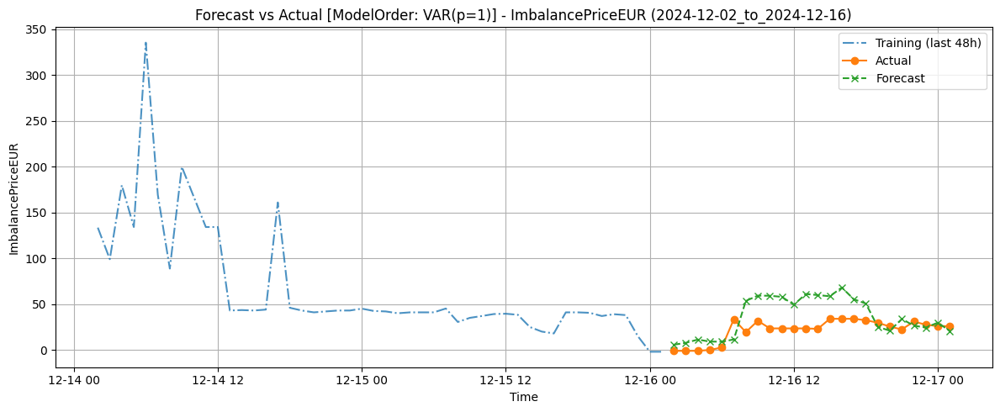

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')
Columns with too few unique values: []


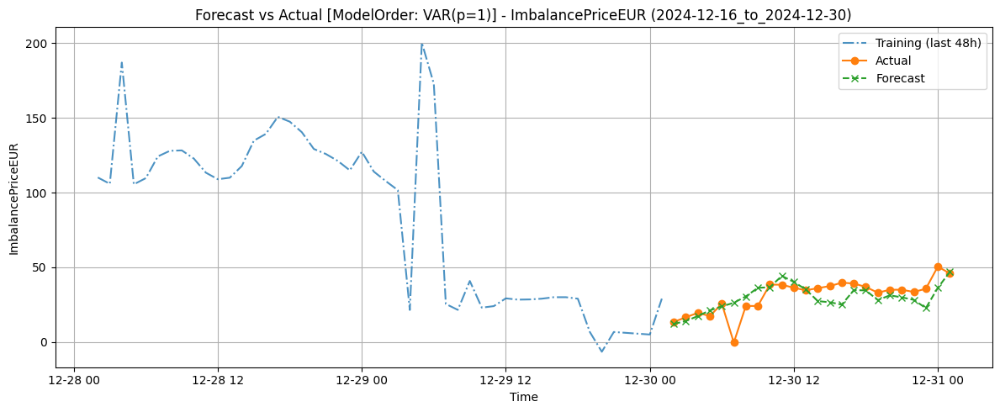

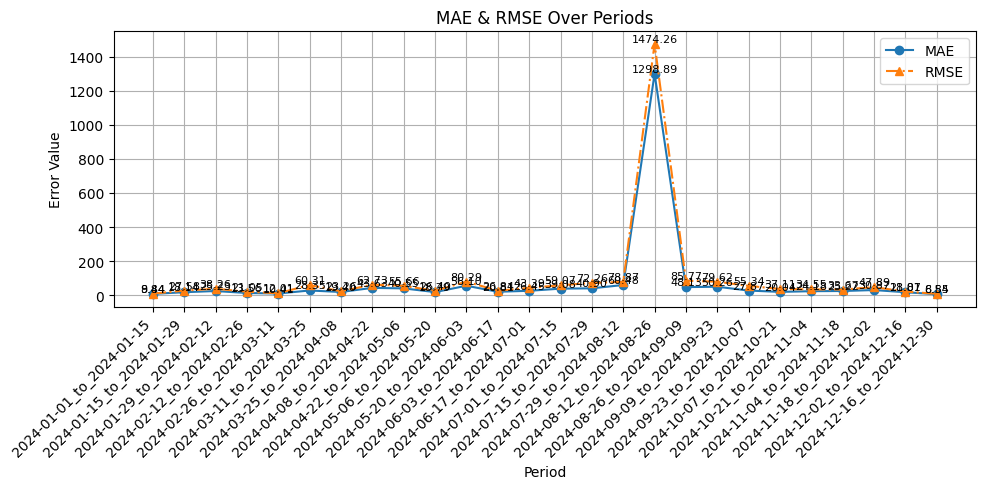

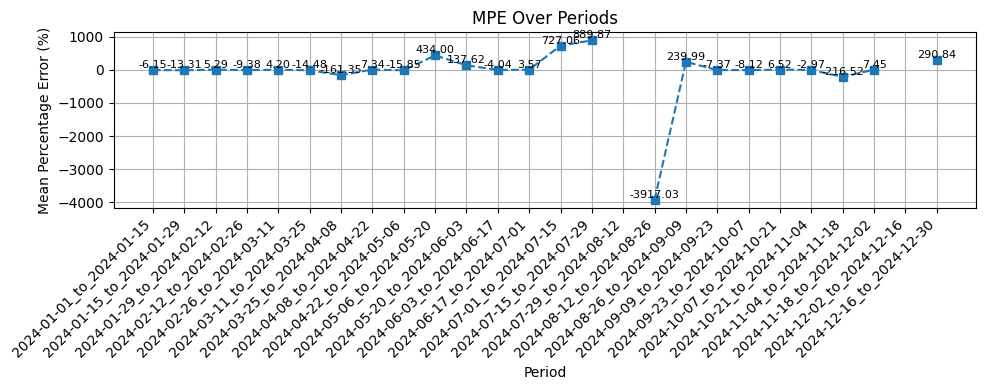

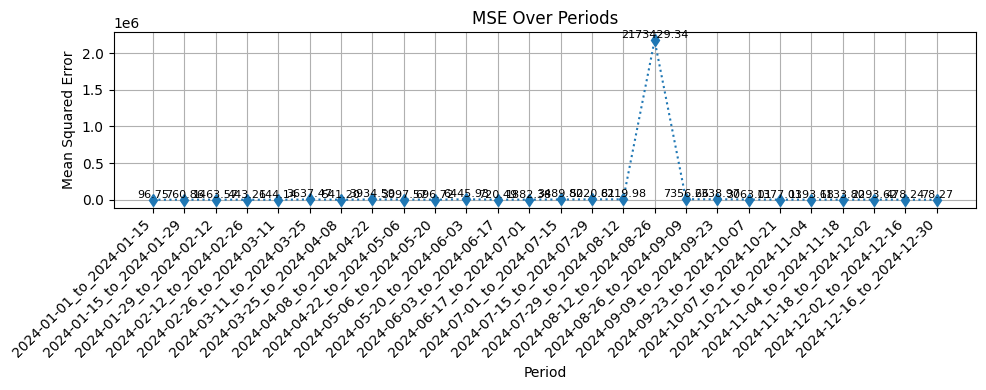

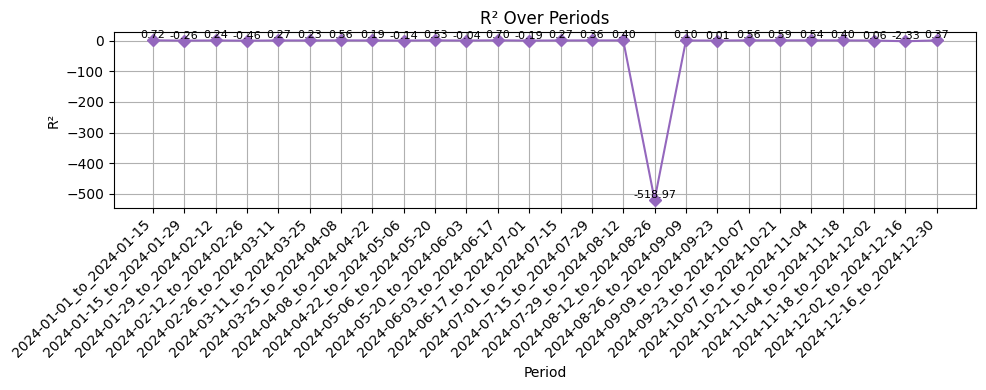

Average metrics across all periods:
  MAE   : 77.7051
  MSE   : 85982.2208
  RMSE  : 99.1048
  R2    : -19.8185
  MPE   : -inf


In [80]:
metrics_Bi_weekly_VAR = {}
for i in range(len(bi_weekly_dir_VAR['period'])):
    period = bi_weekly_dir_VAR['period'][i]
    train_df = bi_weekly_dir_VAR['train'][i]
    test_df  = bi_weekly_dir_VAR['test'][i]
    print(train_df.columns)
    
    
    MIN_UNIQUE_THRESHOLD = 5  # or 10 for safety
    low_variance_cols = train_df.columns[train_df.nunique() <= MIN_UNIQUE_THRESHOLD]
    print("Columns with too few unique values:", list(low_variance_cols))
    train_df = train_df.drop(columns=low_variance_cols)
    test_df = test_df[train_df.columns]

    #plot_var_criteria(train_df, maxlags=10)
    
    var = VAR(train_df)
    p   = var.select_order(maxlags=10).bic
    model_fitted = var.fit(p)

    # 3) rolling one‐step forecast
    history = train_df.copy()
    preds    = []
    target_idx = train_df.columns.get_loc(target_col_VAR)
    H = 24

    for t in range(H):
        # use last p rows to forecast one step
        last_p = history.values[-p:]
        yhat   = model_fitted.forecast(y=last_p, steps=1)
        preds.append(yhat[0, target_idx])
        # append the **actual** test row so next step uses real data
        history = pd.concat([history, test_df.iloc[t:t+1]])

    # 4) assemble predictions into a Series aligned to test index
    forecast_index = test_df.index
    forecast_series = pd.Series(preds, index=forecast_index, name=target_col_VAR)
    # 5) plot & evaluate
    plot_forecast_vs_actual(
        train_df, test_df,
        forecast_series,
        column=target_col_VAR,
        period_label=period,
        model_order=f"VAR(p={p})"
    )
    
    metrics_Bi_weekly_VAR[str(period)] = evaluate_model(test_df[target_col_VAR], forecast_series)



metrics_plot(metrics_Bi_weekly_VAR)

avr_metrics = avg_metrics(metrics_Bi_weekly_VAR)
  


MAE
2024-01-01_to_2024-01-15       8.441222
2024-01-15_to_2024-01-29      18.135687
2024-01-29_to_2024-02-12      25.226327
2024-02-12_to_2024-02-26      13.559443
2024-02-26_to_2024-03-11      10.409419
2024-03-11_to_2024-03-25      28.345528
2024-03-25_to_2024-04-08      19.400983
2024-04-08_to_2024-04-22      43.632962
2024-04-22_to_2024-05-06      40.553924
2024-05-06_to_2024-05-20      18.785992
2024-05-20_to_2024-06-03      56.103100
2024-06-03_to_2024-06-17      20.805458
2024-06-17_to_2024-07-01      26.454721
2024-07-01_to_2024-07-15      39.081021
2024-07-15_to_2024-07-29      40.901374
2024-07-29_to_2024-08-12      60.480902
2024-08-12_to_2024-08-26    1298.891304
2024-08-26_to_2024-09-09      48.132566
2024-09-09_to_2024-09-23      50.257038
2024-09-23_to_2024-10-07      27.869062
2024-10-07_to_2024-10-21      20.037399
2024-10-21_to_2024-11-04      24.181177
2024-11-04_to_2024-11-18      25.220122
2024-11-18_to_2024-12-02      30.871158
2024-12-02_to_2024-12-16      18.010

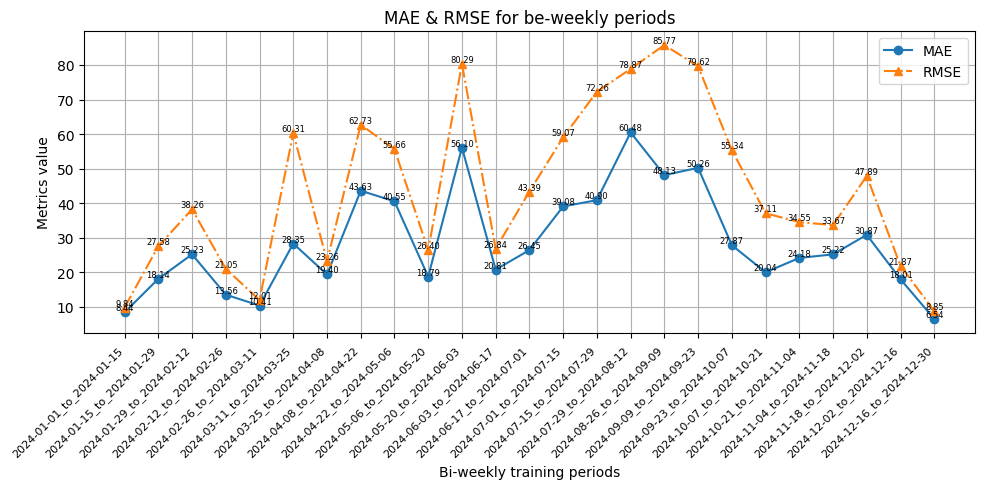

In [79]:
d = pd.DataFrame.from_dict(metrics_Bi_weekly_VAR, orient='index')
#print(b)
mae_varbi= d['MAE']
rmse_varbi= d['RMSE']
print('MAE')
print(mae_varbi)
print('RMSE')
print(rmse_varbi)
mae_varbi = mae_varbi.drop('2024-08-12_to_2024-08-26')
rmse_varbi = rmse_varbi.drop('2024-08-12_to_2024-08-26')
print(np.mean(mae_varbi), np.mean(rmse_varbi))
plt.figure(figsize=(10, 5))
plt.plot(mae_varbi.index, mae_varbi.values,   marker='o', linestyle='-',  label='MAE')
plt.plot(rmse_varbi.index, rmse_varbi.values, marker='^', linestyle='-.', label='RMSE')

for i, (m, r) in enumerate(zip(mae_varbi.values, rmse_varbi.values)):
    plt.text(mae_varbi.index[i],   m, f'{m:.2f}', ha='center', va='bottom', fontsize=6)
    plt.text(rmse_varbi.index[i],  r, f'{r:.2f}', ha='center', va='bottom', fontsize=6)

# Shrink x‐tick labels
plt.xticks(
    rotation=45,
    ha='right',
    fontsize=8,      # make tick labels smaller
    minor=False
)

# If you want to move them a bit away from the axis:
plt.gca().tick_params(axis='x', pad=5)  # increase vertical distance

plt.xlabel('Bi-weekly training periods')
plt.ylabel('Metrics value')
plt.title('MAE & RMSE for be-weekly periods')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Original periods: 26
Kept after clipping tails [1%,99%]: 20


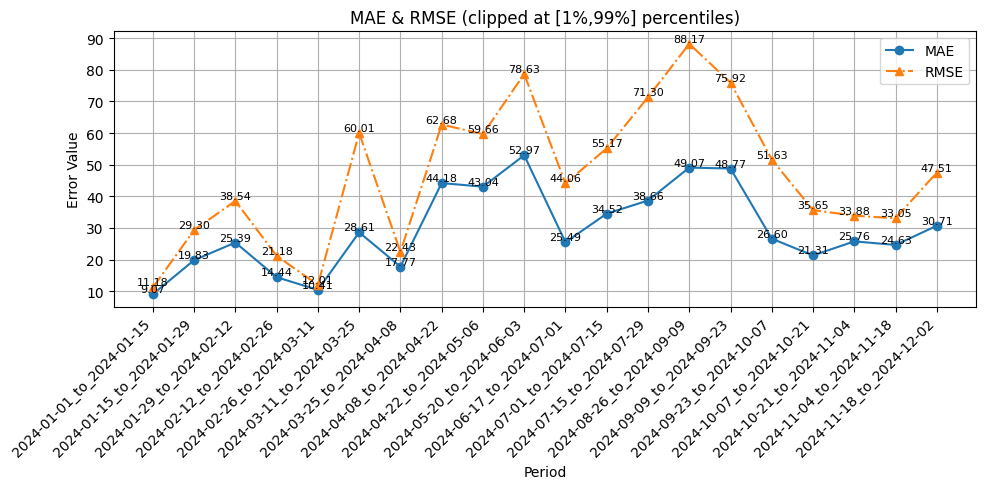

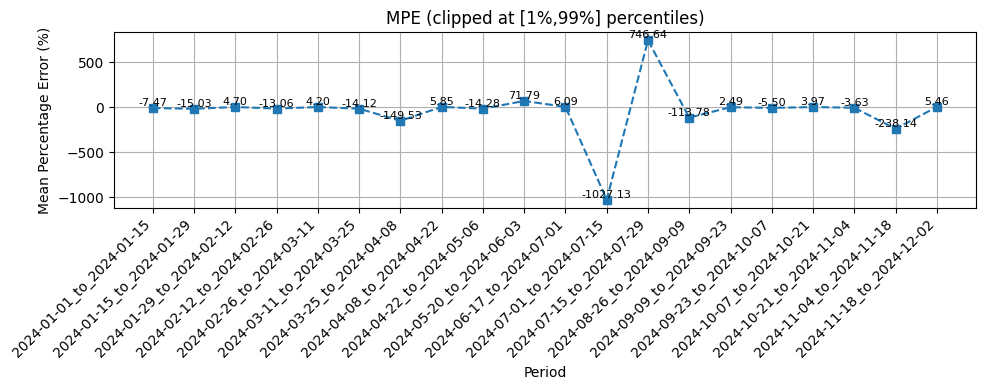

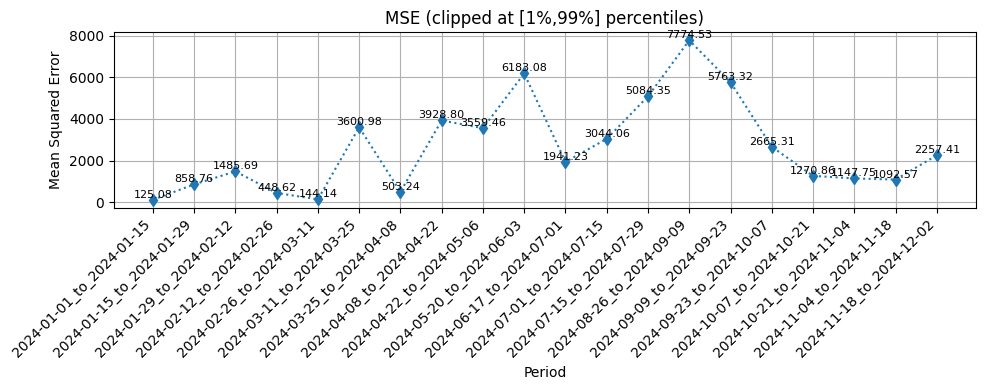

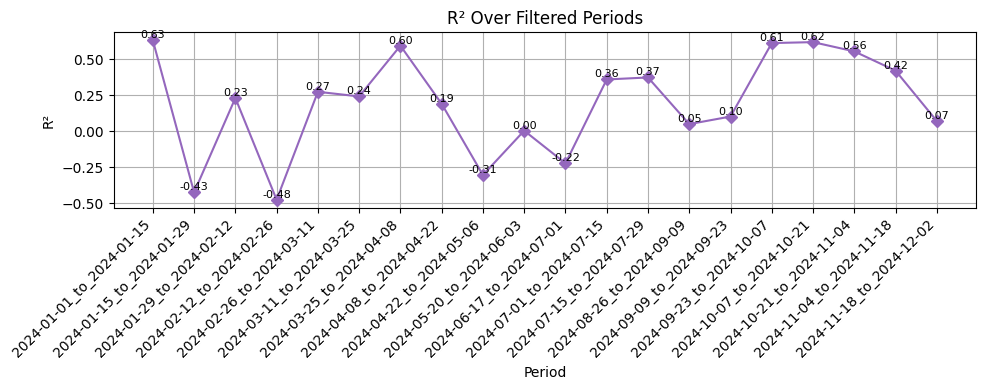

Original periods: 26
Kept after clipping [1%,99%]: 20

Average metrics on cleaned data:
  MAE   : 29.5611
  MSE   : 2643.9622
  RMSE  : 46.5991
  R2    : 0.1953
  MPE   : -37.5247


{'MAE': 29.56110638506277,
 'MSE': 2643.9621847398375,
 'RMSE': 46.59909987330809,
 'R2': 0.1953422337322644,
 'MPE': -37.5246925758972}

In [35]:
metrics_filter_outliers_plot(metrics_Bi_weekly_VAR, pct=0.99)
metrics_filter_outliers_avg(metrics_Bi_weekly_VAR, lower_pct=0.01, upper_pct=0.99)

Columns with too few unique values: []


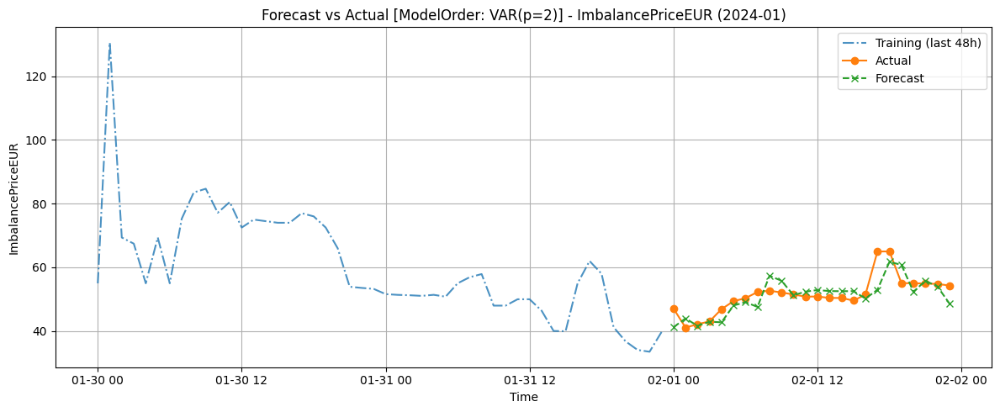

Columns with too few unique values: []


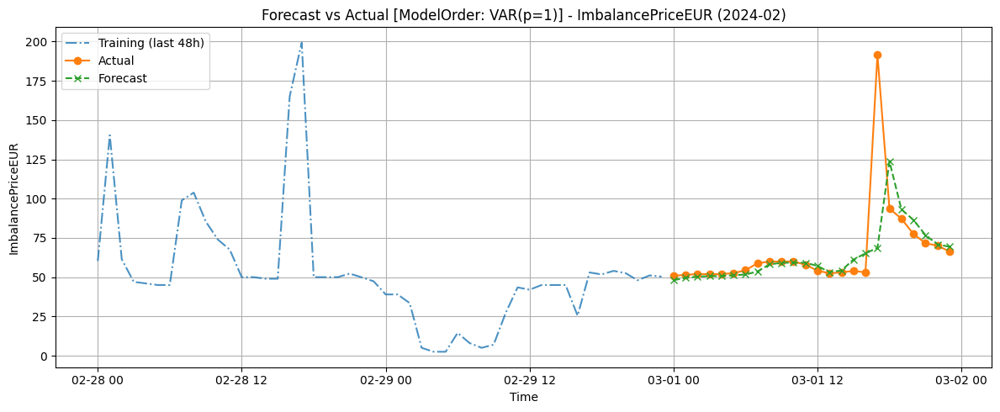

Columns with too few unique values: []


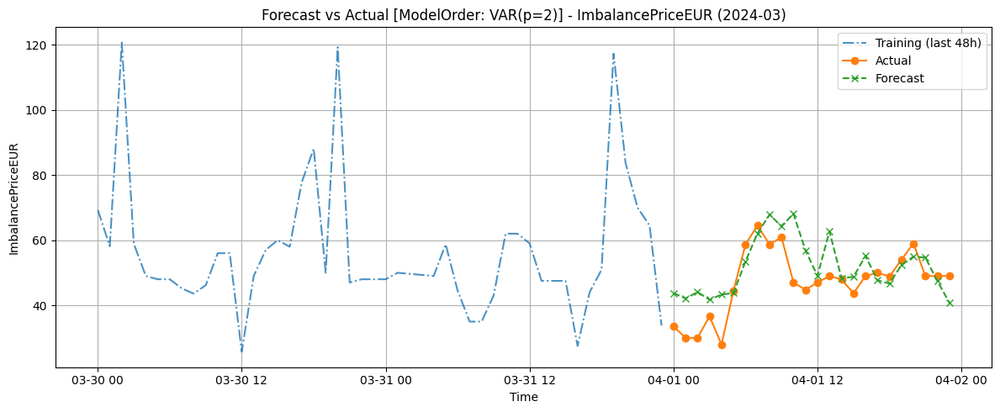

Columns with too few unique values: []


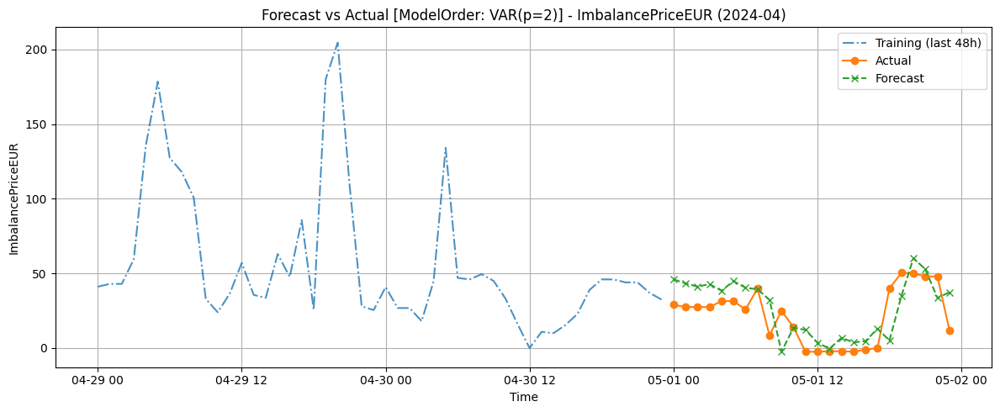

Columns with too few unique values: []


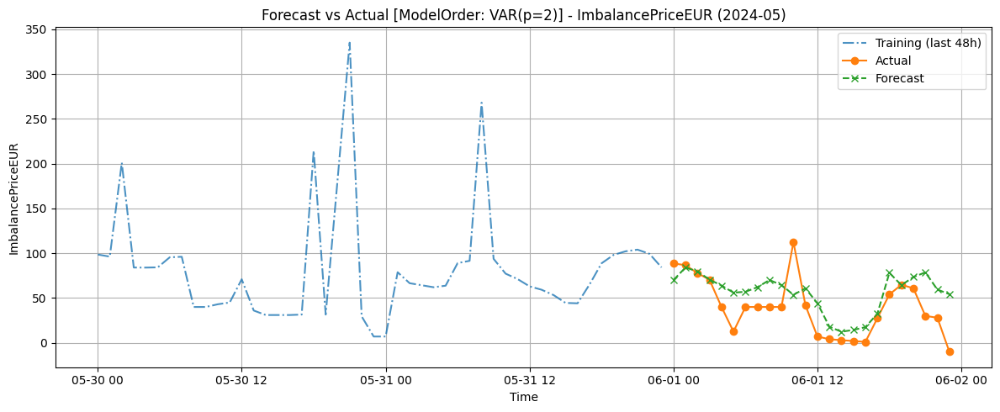

Columns with too few unique values: []


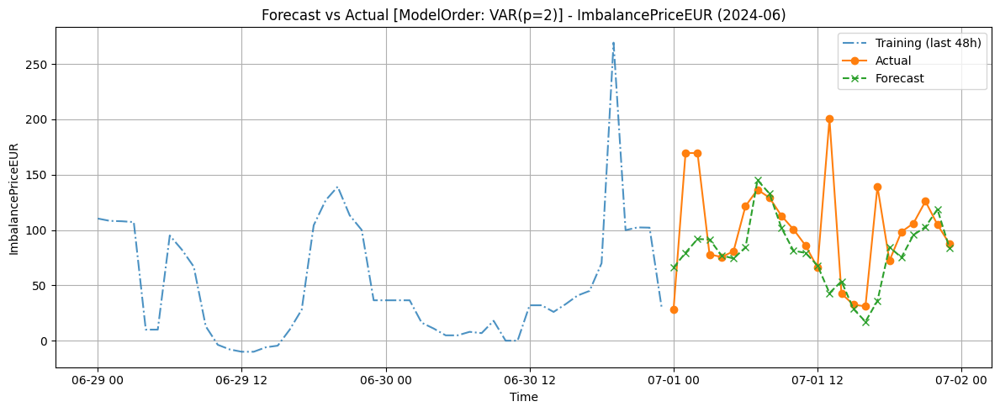

Columns with too few unique values: []


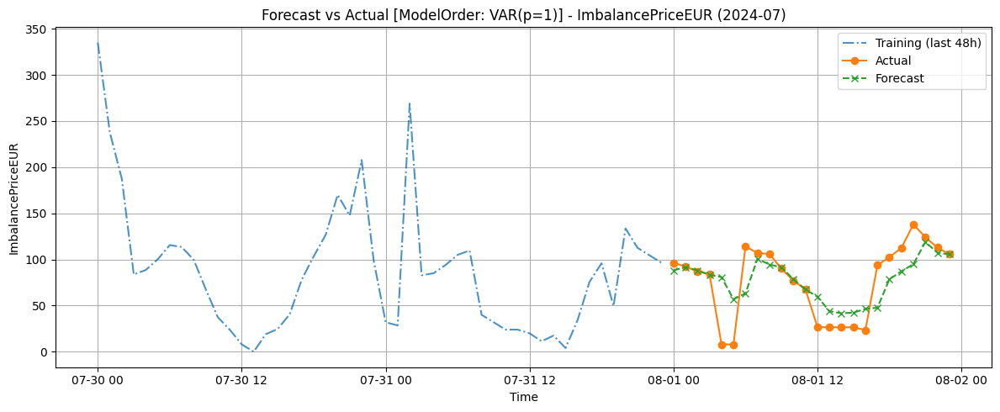

Columns with too few unique values: []


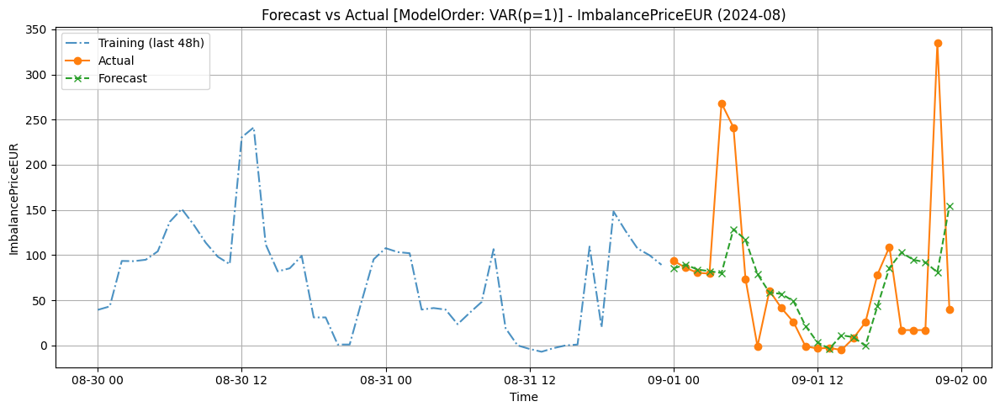

Columns with too few unique values: []


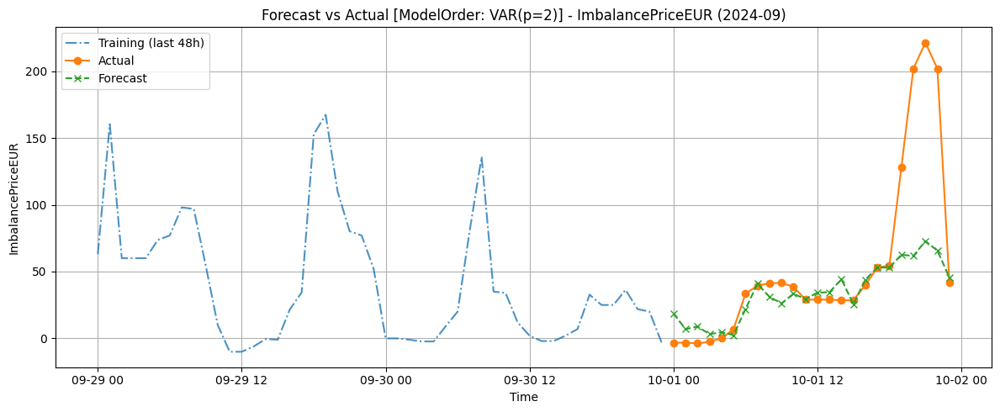

Columns with too few unique values: []


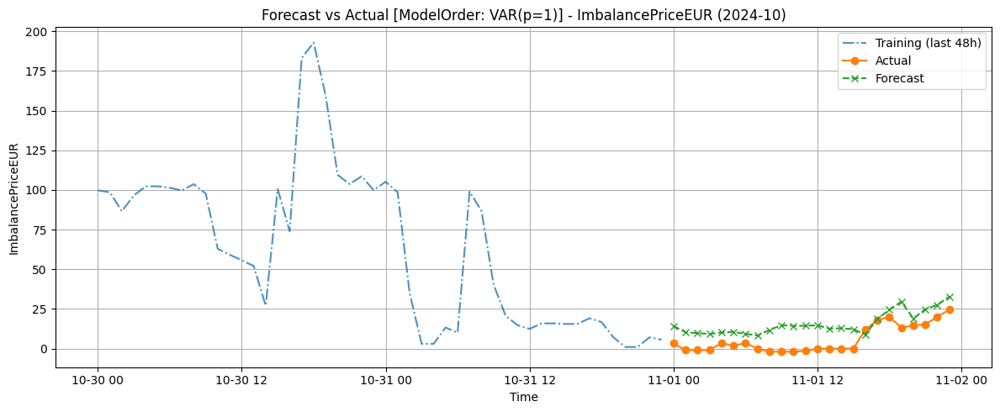

Columns with too few unique values: ['FCRdomestic_MW']


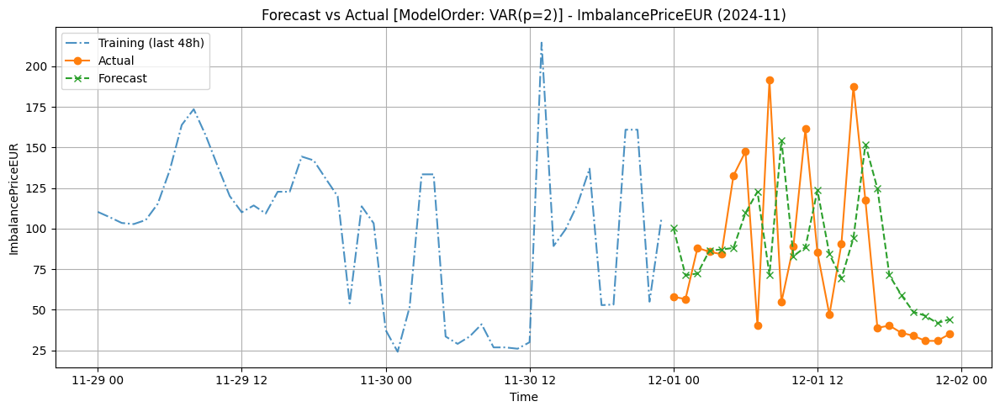

Columns with too few unique values: []


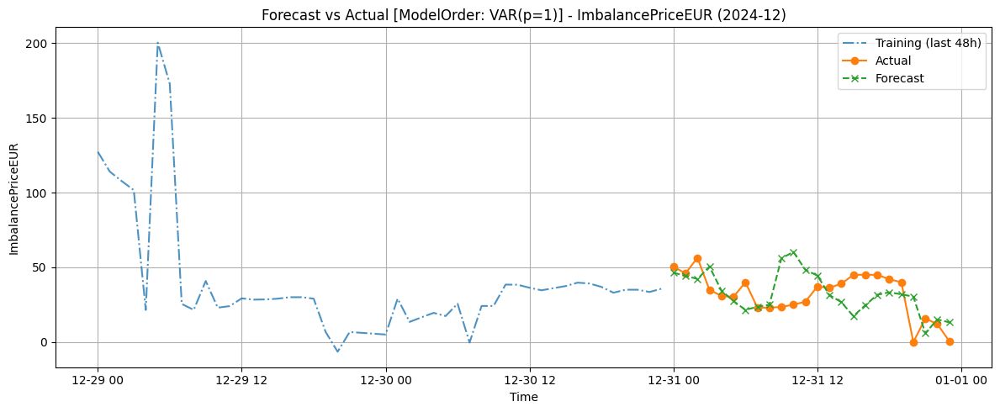

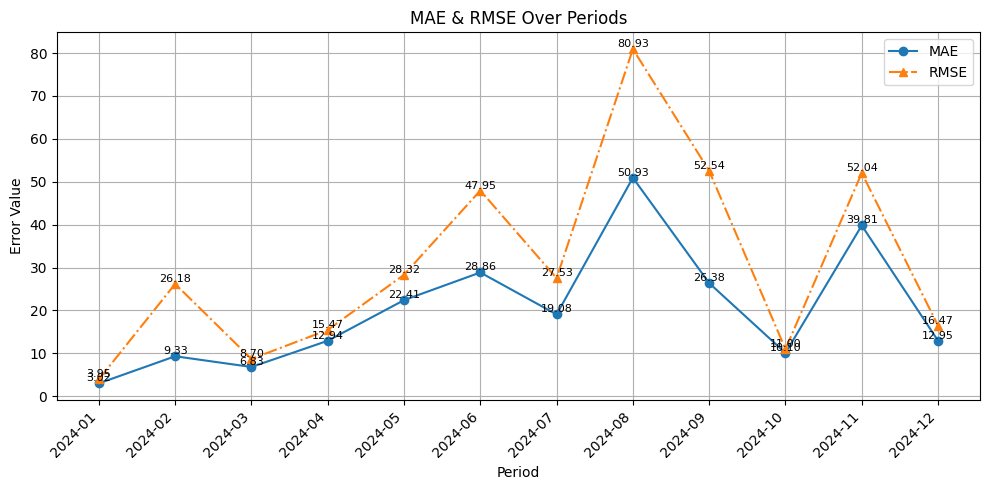

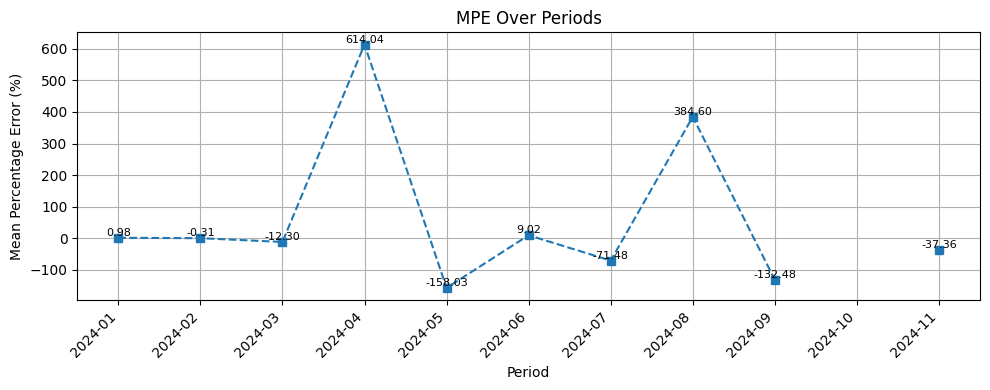

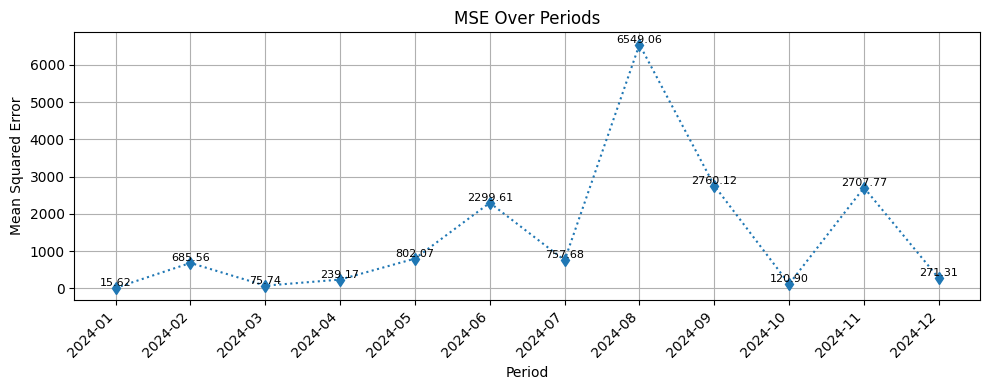

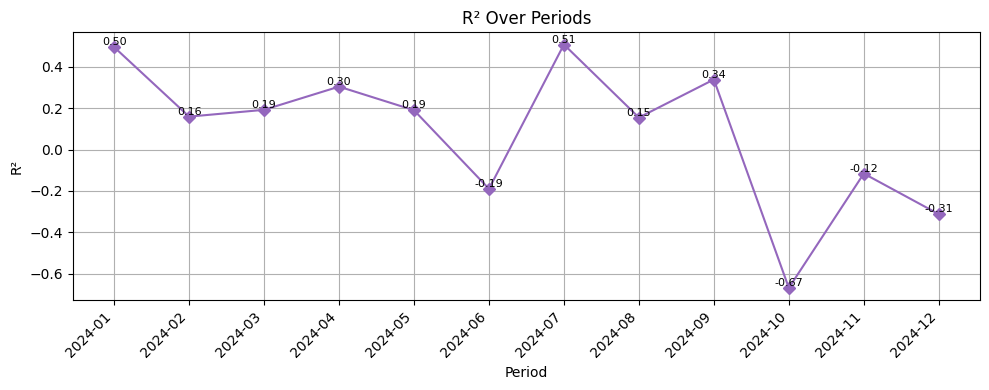

Average metrics across all periods:
  MAE   : 20.2189
  MSE   : 1440.3858
  RMSE  : 30.9226
  R2    : 0.0879
  MPE   : -inf


In [81]:
metrics_Monthly_VAR = {}
for i in range(len(monthly_dir_VAR['period'])):
    period = monthly_dir_VAR['period'][i]
    train_df = monthly_dir_VAR['train'][i]
    test_df  = monthly_dir_VAR['test'][i]
    
    
    
    MIN_UNIQUE_THRESHOLD = 5  # or 10 for safety
    low_variance_cols = train_df.columns[train_df.nunique() <= MIN_UNIQUE_THRESHOLD]
    print("Columns with too few unique values:", list(low_variance_cols))
    train_df = train_df.drop(columns=low_variance_cols)
    test_df = test_df[train_df.columns]

    #plot_var_criteria(train_df, maxlags=10)
    
    
    
    var = VAR(train_df)
    p   = var.select_order(maxlags=10).bic
    model_fitted = var.fit(p)

    # 3) rolling one‐step forecast
    history = train_df.copy()
    preds    = []
    target_idx = train_df.columns.get_loc(target_col_VAR)
    H = 24

    for t in range(H):
        # use last p rows to forecast one step
        last_p = history.values[-p:]
        yhat   = model_fitted.forecast(y=last_p, steps=1)
        preds.append(yhat[0, target_idx])
        # append the **actual** test row so next step uses real data
        history = pd.concat([history, test_df.iloc[t:t+1]])

    # 4) assemble predictions into a Series aligned to test index
    forecast_index = test_df.index
    forecast_series = pd.Series(preds, index=forecast_index, name=target_col_VAR)
    # 5) plot & evaluate
    plot_forecast_vs_actual(
        train_df, test_df,
        forecast_series,
        column=target_col_VAR,
        period_label=period,
        model_order=f"VAR(p={p})"
    )
    
    metrics_Monthly_VAR[str(period)] = evaluate_model(test_df[target_col_VAR], forecast_series)



metrics_plot(metrics_Monthly_VAR)

avr_metrics = avg_metrics(metrics_Monthly_VAR)

MAE
2024-01     3.015360
2024-02     9.331747
2024-03     6.830648
2024-04    12.937766
2024-05    22.407935
2024-06    28.856314
2024-07    19.080101
2024-08    50.930341
2024-09    26.380499
2024-10    10.096821
2024-11    39.807681
2024-12    12.951942
Name: MAE, dtype: float64
RMSE
2024-01     3.952018
2024-02    26.183188
2024-03     8.702977
2024-04    15.465264
2024-05    28.320877
2024-06    47.954272
2024-07    27.526027
2024-08    80.926293
2024-09    52.536877
2024-10    10.995574
2024-11    52.036197
2024-12    16.471551
Name: RMSE, dtype: float64
20.218929641433466 30.922593030160808


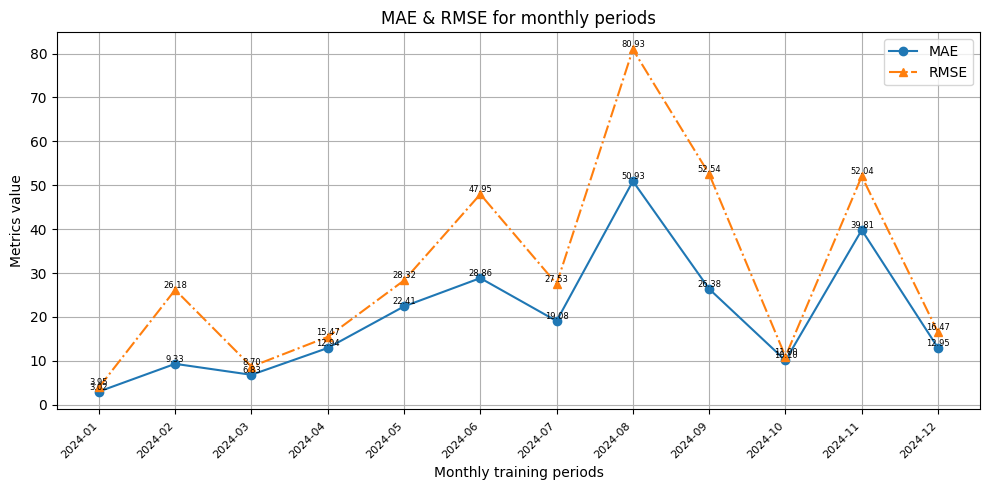

In [83]:
e = pd.DataFrame.from_dict(metrics_Monthly_VAR, orient='index')
#print(b)
mae_varbi= e['MAE']
rmse_varbi= e['RMSE']
print('MAE')
print(mae_varbi)
print('RMSE')
print(rmse_varbi)
print(np.mean(mae_varbi), np.mean(rmse_varbi))
plt.figure(figsize=(10, 5))
plt.plot(mae_varbi.index, mae_varbi.values,   marker='o', linestyle='-',  label='MAE')
plt.plot(rmse_varbi.index, rmse_varbi.values, marker='^', linestyle='-.', label='RMSE')

for i, (m, r) in enumerate(zip(mae_varbi.values, rmse_varbi.values)):
    plt.text(mae_varbi.index[i],   m, f'{m:.2f}', ha='center', va='bottom', fontsize=6)
    plt.text(rmse_varbi.index[i],  r, f'{r:.2f}', ha='center', va='bottom', fontsize=6)

# Shrink x‐tick labels
plt.xticks(
    rotation=45,
    ha='right',
    fontsize=8,      # make tick labels smaller
    minor=False
)

# If you want to move them a bit away from the axis:
plt.gca().tick_params(axis='x', pad=5)  # increase vertical distance

plt.xlabel('Monthly training periods')
plt.ylabel('Metrics value')
plt.title('MAE & RMSE for monthly periods')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Columns with too few unique values: []


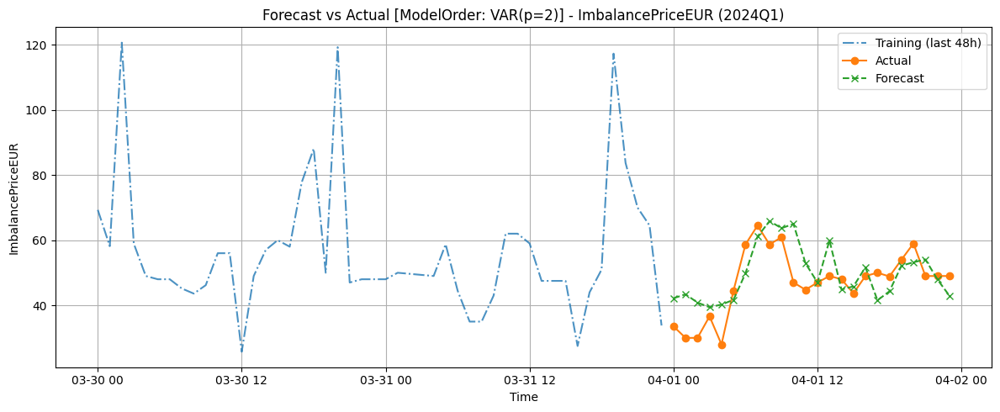

Columns with too few unique values: []


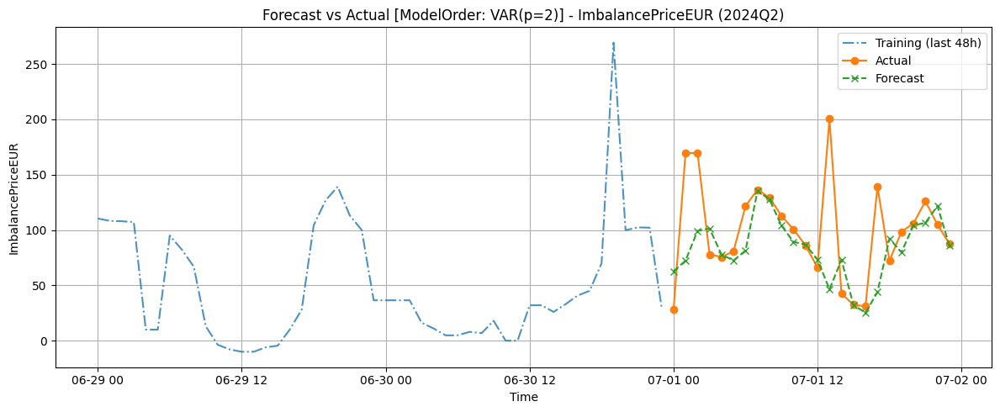

Columns with too few unique values: []


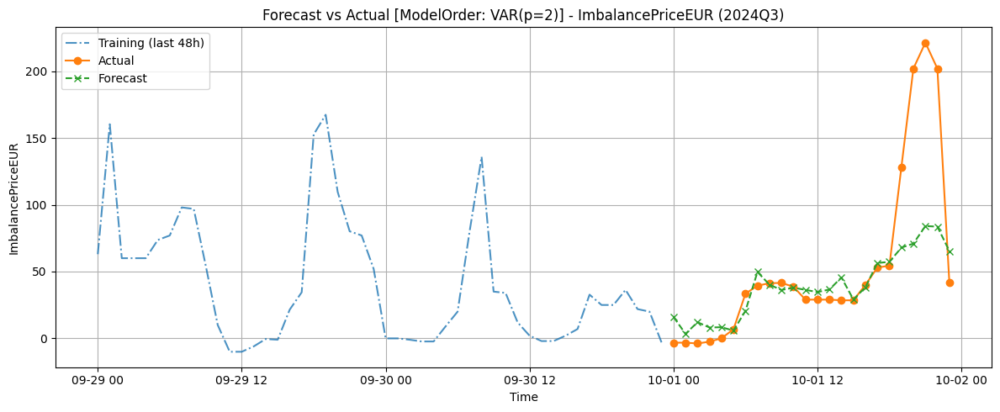

Columns with too few unique values: []


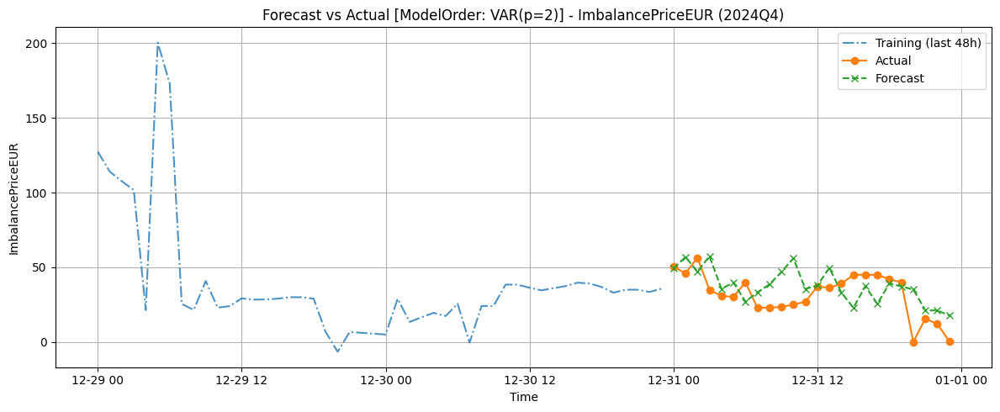

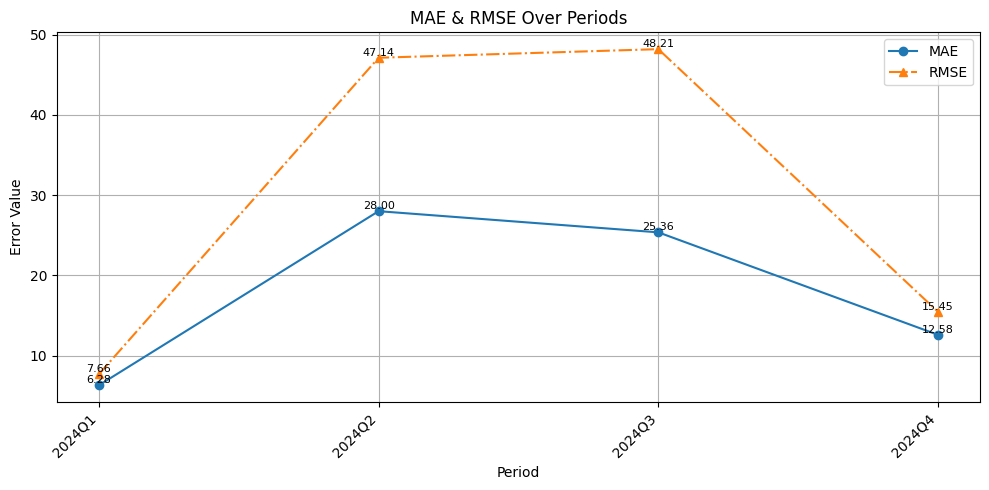

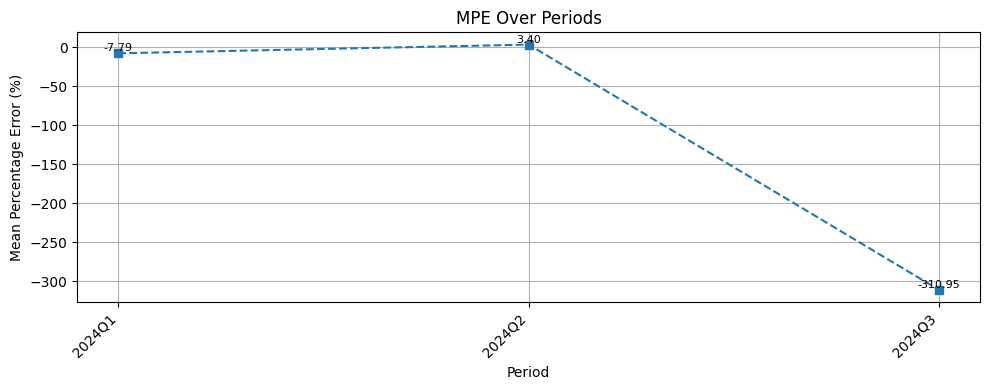

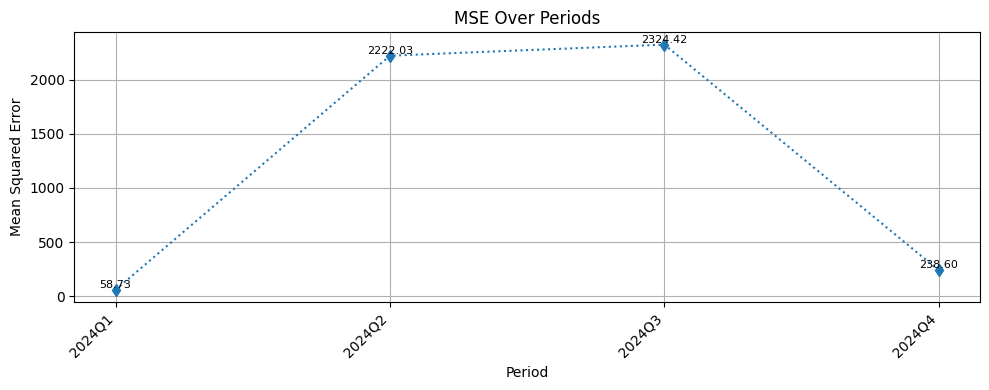

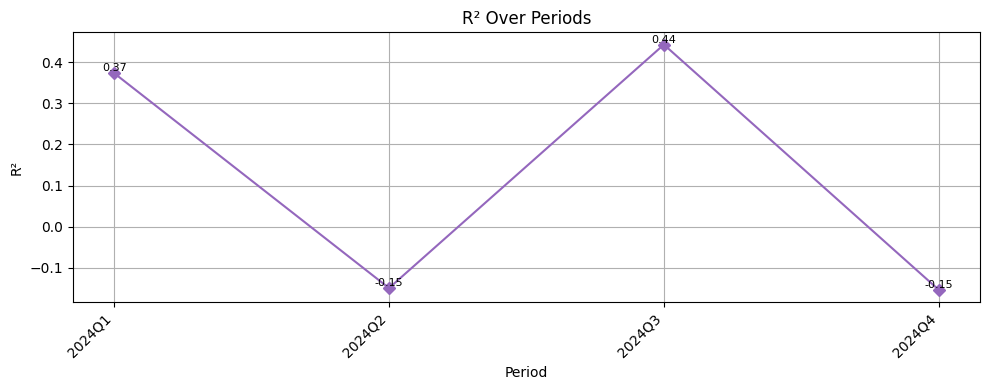

Average metrics across all periods:
  MAE   : 18.0568
  MSE   : 1210.9434
  RMSE  : 29.6152
  R2    : 0.1282
  MPE   : -inf


{'MAE': 18.056789849393365,
 'MSE': 1210.9433911378146,
 'RMSE': 29.615204345610962,
 'R2': 0.12824182678476023,
 'MPE': -inf}

In [85]:
metrics_Quarterly_VAR = {}
for i in range(len(quarterly_dir_VAR['period'])):
    period = quarterly_dir_VAR['period'][i]
    train_df = quarterly_dir_VAR['train'][i]
    test_df  = quarterly_dir_VAR['test'][i]
    
    
    
    MIN_UNIQUE_THRESHOLD = 5  # or 10 for safety
    low_variance_cols = train_df.columns[train_df.nunique() <= MIN_UNIQUE_THRESHOLD]
    print("Columns with too few unique values:", list(low_variance_cols))
    train_df = train_df.drop(columns=low_variance_cols)
    test_df = test_df[train_df.columns]

    #plot_var_criteria(train_df, maxlags=10)
    
    
    
    var = VAR(train_df)
    p   = var.select_order(maxlags=10).bic
    model_fitted = var.fit(p)

    # 3) rolling one‐step forecast
    history = train_df.copy()
    preds    = []
    target_idx = train_df.columns.get_loc(target_col_VAR)
    H = 24

    for t in range(H):
        # use last p rows to forecast one step
        last_p = history.values[-p:]
        yhat   = model_fitted.forecast(y=last_p, steps=1)
        preds.append(yhat[0, target_idx])
        # append the **actual** test row so next step uses real data
        history = pd.concat([history, test_df.iloc[t:t+1]])

    # 4) assemble predictions into a Series aligned to test index
    forecast_index = test_df.index
    forecast_series = pd.Series(preds, index=forecast_index, name=target_col_VAR)
    # 5) plot & evaluate
    plot_forecast_vs_actual(
        train_df, test_df,
        forecast_series,
        column=target_col_VAR,
        period_label=period,
        model_order=f"VAR(p={p})"
    )
    metrics_Quarterly_VAR[str(period)] = evaluate_model(test_df[target_col_VAR], forecast_series)

# 6) summarize
metrics_plot(metrics_Quarterly_VAR)
avg_metrics(metrics_Quarterly_VAR)

MAE
2024Q1     6.284769
2024Q2    28.002171
2024Q3    25.363443
2024Q4    12.576776
Name: MAE, dtype: float64
RMSE
2024Q1     7.663588
2024Q2    47.138376
2024Q3    48.212218
2024Q4    15.446635
Name: RMSE, dtype: float64
18.056789849393365 29.615204345610962


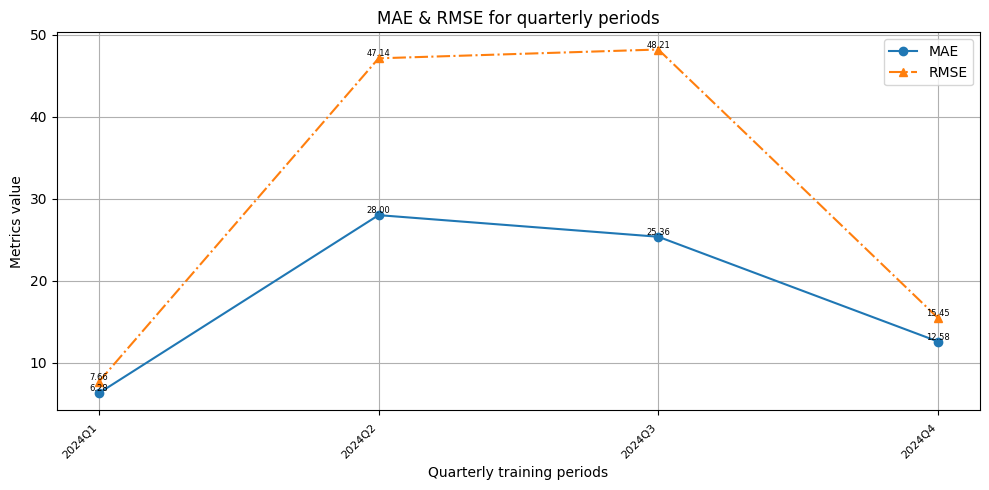

: 

In [ ]:
s = pd.DataFrame.from_dict(metrics_Quarterly_VAR, orient='index')
#print(b)
mae_varbi= s['MAE']
rmse_varbi= s['RMSE']
print('MAE')
print(mae_varbi)
print('RMSE')
print(rmse_varbi)
print(np.mean(mae_varbi), np.mean(rmse_varbi))
plt.figure(figsize=(10, 5))
plt.plot(mae_varbi.index, mae_varbi.values,   marker='o', linestyle='-',  label='MAE')
plt.plot(rmse_varbi.index, rmse_varbi.values, marker='^', linestyle='-.', label='RMSE')

for i, (m, r) in enumerate(zip(mae_varbi.values, rmse_varbi.values)):
    plt.text(mae_varbi.index[i],   m, f'{m:.2f}', ha='center', va='bottom', fontsize=6)
    plt.text(rmse_varbi.index[i],  r, f'{r:.2f}', ha='center', va='bottom', fontsize=6)

# Shrink x‐tick labels
plt.xticks(
    rotation=45,
    ha='right',
    fontsize=8,      # make tick labels smaller
    minor=False
)

# If you want to move them a bit away from the axis:
plt.gca().tick_params(axis='x', pad=5)  # increase vertical distance

plt.xlabel('Quarterly training periods')
plt.ylabel('Metrics value')
plt.title('MAE & RMSE for quarterly periods')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# 4. LSTM - init

In [38]:
bi_weekly_dir_LSTM = split_biweekly_train_test(df_final_index_NO_diff)
monthly_dir_LSTM = split_monthly_train_test(df_final_index_NO_diff)
quarterly_dir_LSTM = split_quarterly_train_test(df_final_index_NO_diff)

Total periods: 26
2024-01-01_to_2024-01-15: Train = 336, Test = 24
2024-01-15_to_2024-01-29: Train = 336, Test = 24
2024-01-29_to_2024-02-12: Train = 336, Test = 24
2024-02-12_to_2024-02-26: Train = 336, Test = 24
2024-02-26_to_2024-03-11: Train = 336, Test = 24
2024-03-11_to_2024-03-25: Train = 336, Test = 24
2024-03-25_to_2024-04-08: Train = 336, Test = 24
2024-04-08_to_2024-04-22: Train = 336, Test = 24
2024-04-22_to_2024-05-06: Train = 336, Test = 24
2024-05-06_to_2024-05-20: Train = 336, Test = 24
2024-05-20_to_2024-06-03: Train = 336, Test = 24
2024-06-03_to_2024-06-17: Train = 336, Test = 24
2024-06-17_to_2024-07-01: Train = 336, Test = 24
2024-07-01_to_2024-07-15: Train = 336, Test = 24
2024-07-15_to_2024-07-29: Train = 336, Test = 24
2024-07-29_to_2024-08-12: Train = 336, Test = 24
2024-08-12_to_2024-08-26: Train = 336, Test = 24
2024-08-26_to_2024-09-09: Train = 336, Test = 24
2024-09-09_to_2024-09-23: Train = 336, Test = 24
2024-09-23_to_2024-10-07: Train = 336, Test = 24
20

In [39]:
def save_split_to_csv(split_dict, split_name, output_dir='.'):
    """
    Write out train/test CSVs for a generic split dict, naming the index column "date".

    Parameters
    ----------
    split_dict : dict
        {
          'period': ['2024Q1','2024Q2',…] or ['2024-01_to_2024-01-14',…], etc.
          'train' : [DataFrame, …],
          'test'  : [DataFrame, …]
        }
    split_name : str
        A prefix to use in the filenames, e.g. "quarterly", "biweekly", "monthly".
    output_dir : str
        Directory in which to write the CSVs.
    """
    os.makedirs(output_dir, exist_ok=True)

    for period, train_df, test_df in zip(
        split_dict['period'],
        split_dict['train'],
        split_dict['test']
    ):
        # ensure index name shows up as first column header
        train_df = train_df.copy()
        test_df  = test_df.copy()
        train_df.index.name = 'Date'
        test_df.index.name  = 'Date'

        # sanitize period for filenames
        label = period.replace('/', '_').replace(' ', '_')

        train_path = os.path.join(output_dir, f"{split_name}_train_{label}.csv")
        test_path  = os.path.join(output_dir, f"{split_name}_test_{label}.csv")

        train_df.to_csv(train_path, index=True)
        test_df.to_csv(test_path,   index=True)

        print(f"Wrote {train_path} ({len(train_df)} rows), {test_path} ({len(test_df)} rows)")




In [40]:
#save_split_to_csv(    bi_weekly_dir_LSTM,    split_name='biweekly', output_dir='biweekly_csvs')

In [41]:
#save_split_to_csv(    monthly_dir_LSTM,    split_name='monthly', output_dir='monthly_csvs')

In [42]:
#save_split_to_csv( quarterly_dir_LSTM,    split_name='quarterly',    output_dir='quarterly_csvs')

In [43]:
#d = os.path.join('All_data_csv/', "All_cleared_data.csv")
#df_final_index_NO_diff.to_csv(d, index=True)

In [44]:
df_final_index_NO_diff.columns

Index(['ImbalanceMWh', 'ImbalancePriceEUR', 'mFRR_UpPurchased',
       'mFRR_UpPriceEUR', 'SpotPriceEUR', 'FCRdomestic_MW', 'FCRdk_EUR'],
      dtype='object')

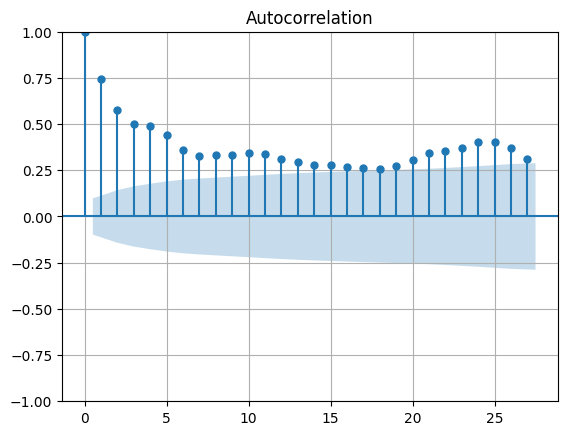

In [45]:

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Plotting the Autocorrelation plot.
plot_acf(df_work['ImbalancePriceEUR'][366:766])
plt.grid(True)

plt.show()

In [46]:
Q1 = df_final_index_NO_diff['ImbalanceMWh'].quantile(0.25)
Q3 = df_final_index_NO_diff['ImbalanceMWh'].quantile(0.75)
IQR = Q3 - Q1
lower = Q1 - 1.5 * IQR
upper = Q3 + 1.5 * IQR
print(lower,upper)

-391.5 220.5


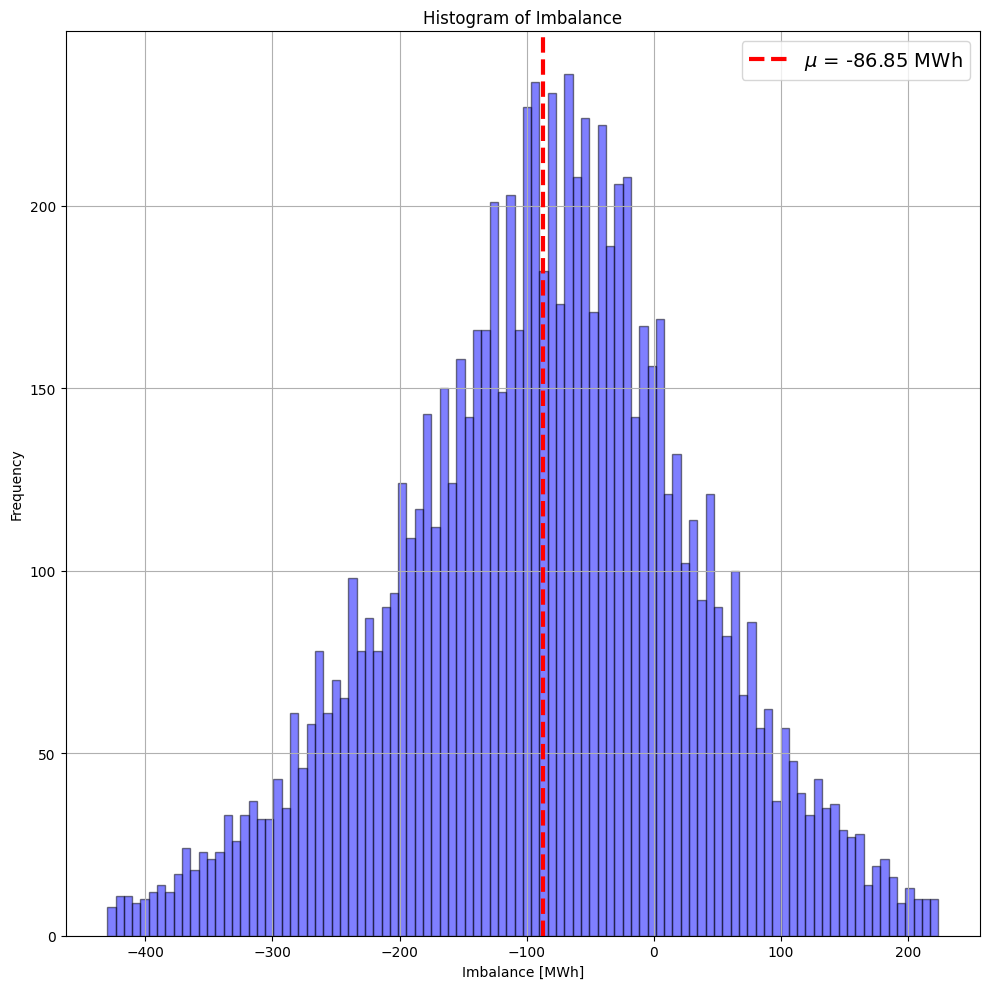

In [47]:
# Calculate the mean
mean_value = df_work['ImbalanceMWh'].mean()

# Create the histogram
plt.figure(figsize=(10, 10))
n, bins, patches = plt.hist(df_work['ImbalanceMWh'], bins=100, color='blue', edgecolor='black', alpha=0.5)

mean_value_bfr = -90.54


# Plot the mean as a vertical line
plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=3, label=f'$\mu$ = {mean_value:.2f} MWh')

# Add labels and title
plt.title('Histogram of Imbalance')
plt.xlabel('Imbalance [MWh]')
plt.ylabel('Frequency')
plt.grid(True)

# Make legend larger
plt.legend(fontsize=14)

plt.tight_layout()
plt.show()


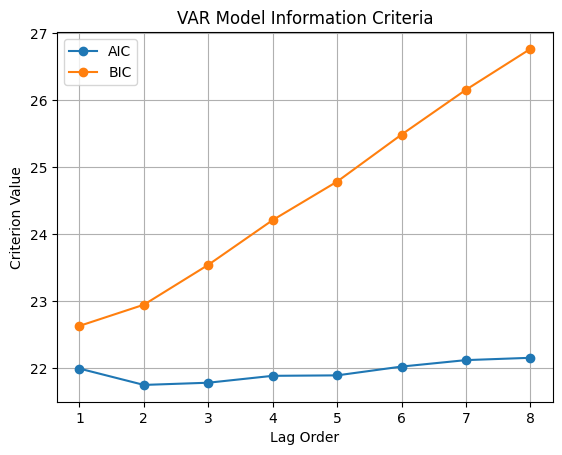

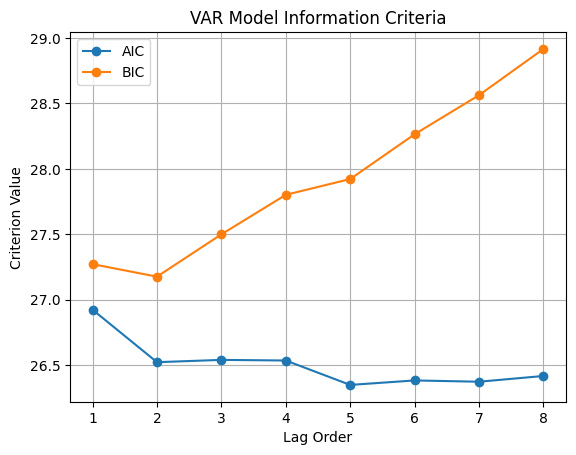

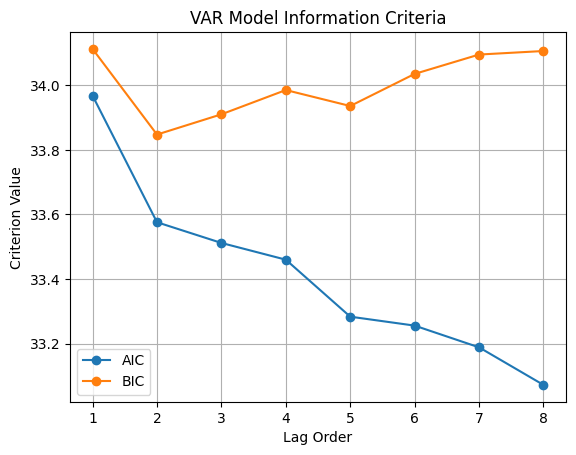

In [77]:
a1 = pd.DataFrame.from_dict(bi_weekly_dir_VAR)
a2 =  pd.DataFrame.from_dict(monthly_dir_VAR)
a3 = pd.DataFrame.from_dict(quarterly_dir_VAR)
a1.head()
#plot_acf(df_work['ImbalancePriceEUR'], lags=60)
plot_var_criteria(bi_weekly_dir_VAR['train'][6], maxlags=8)
plot_var_criteria(monthly_dir_VAR['train'][0], maxlags=8)
plot_var_criteria(quarterly_dir_VAR['train'][2], maxlags=8)
plt.show()